<h2><center> Welcome to the Ernst & Young Carbon Prediction Hackathon</h2></center>
<figure>
<!-- <center><img src ="https://drive.google.com/uc?export=view&id=1hSOAfRhJ_jo-MZAjq81VYJu5bZNL7EjD" width = "800" height = '500'/> -->

*About the problem*
> The ability to accurately monitor carbon emissions is a critical step in the fight against climate change. Precise carbon readings allow researchers and governments to understand the sources and patterns of carbon mass output. While Europe and North America have extensive systems in place to monitor carbon emissions on the ground, there are few available in Africa.

*Objective of this challenge*
> The objective of this challenge is to create machine learning or a deep learning model using open-source CO2 emissions data (from Sentinel-5P satellite observations) to predict carbon emissions.

These solutions will enable EY, governments, and other actors to estimate carbon emission levels across Africa, even in places where on-the-ground monitoring is not possible.



## Table of contents:

1. [Installing and importing libraries](#Libraries)
2. [Loading data](#Data)
3. [Statistical summaries](#Statistics)
4. [Outliers](#Outliers)
5. [Geo Visualisation - EDA](#Geo)
5. [Missing values and duplicates](#Missing)
6. [Date features EDA](#Dates)
7. [Correlations - EDA](#Correlations)
9. [Timeseries visualization - EDA](#Timeseries)
10. [Feature engineering](#Engineering)
11. [Modelling](#Modelling)
12. [Making predictions of the test set and creating a submission file](#Predictions)

<a name="Libraries"></a>
## 1. Installing and importing libraries


In [102]:
%%capture
# Install relevant libraries
!pip install geopandas folium 

In [103]:
# Import libraries
import pandas as pd
import numpy as np
import random
import os
from tqdm.notebook import tqdm

import geopandas as gpd
from shapely.geometry import Point
import folium

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
pd.options.display.float_format = '{:.5f}'.format
pd.options.display.max_rows = None
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [104]:
# Set seed for reproducability
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

<a name="Data"></a>
## 2. Loading and previewing data

In [105]:
# DATA_PATH = ''
# # Load files
# train = pd.read_csv(os.path.join(DATA_PATH, 'Train.csv'))
# test = pd.read_csv(os.path.join(DATA_PATH, 'Test.csv'))
# samplesubmission = pd.read_csv(os.path.join(DATA_PATH, 'SampleSubmission.csv'))
# Load files
train = pd.read_csv('Train.csv')
test = pd.read_csv('Test.csv')
samplesubmission = pd.read_csv('SampleSubmission.csv')

# Preview train dataset
train.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-23.73_28.77_2019_1,-23.73000,28.77000,2019,1,0.00017,0.71317,0.00010,0.22393,24.93944,...,5566.22202,54826.03262,4606.20999,19.11528,0.35378,24.95195,49.05395,-89.63803,17.98887,86.05170
1,ID_-23.73_28.77_2019_2,-23.73000,28.77000,2019,2,-0.00016,0.81291,-0.00014,0.08028,16.62416,...,3711.51137,68491.75334,3034.46166,12.21866,0.24499,4.70886,42.58668,-89.90431,22.77325,88.87567
2,ID_-23.73_28.77_2019_3,-23.73000,28.77000,2019,3,-0.00007,0.86031,-0.00006,0.16105,-13.23724,...,2136.38519,78967.73955,1433.48259,6.06274,0.24510,76.06063,34.73754,-83.59525,17.43730,91.72311
3,ID_-23.73_28.77_2019_4,-23.73000,28.77000,2019,4,0.00015,0.42228,0.00009,0.04650,-13.53465,...,3841.85302,64592.80677,2878.51292,6.38823,0.21090,75.91237,60.29449,-71.89673,11.97782,92.88387
4,ID_-23.73_28.77_2019_5,-23.73000,28.77000,2019,5,0.00002,1.00458,0.00003,0.21425,-13.47572,...,1295.68817,86804.02539,1094.66534,9.20625,0.26110,-13.34608,50.19449,-77.46208,24.37427,94.87833


In [106]:
# Preview test dataset
test.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle
0,ID_-23.53_27.47_2019_1,-23.53000,27.47000,2019,1,0.00008,0.45447,0.00003,0.11429,-80.28631,...,74897.05200,2180.26654,81287.07448,1562.03102,10.73412,0.28066,-31.23017,33.33797,-93.21726,23.35825
1,ID_-23.53_27.47_2019_2,-23.53000,27.47000,2019,2,0.00018,0.42317,0.00006,0.07510,-17.76569,...,84222.65352,982.61906,90307.65001,927.11122,5.25002,0.23893,66.49090,58.13779,-85.00147,13.41648
2,ID_-23.53_27.47_2019_3,-23.53000,27.47000,2019,3,0.00006,0.71309,0.00004,0.11421,16.72565,...,78922.49079,1582.96493,85383.15185,1006.77811,6.81937,0.25868,75.92319,41.33695,-83.26754,16.27300
3,ID_-23.53_27.47_2019_4,-23.53000,27.47000,2019,4,0.00048,0.43445,0.00017,0.13139,-22.47534,...,61135.91959,3935.41998,67490.03136,3428.42353,6.23363,0.28154,-11.02323,60.68987,-77.76372,22.79396
4,ID_-23.53_27.47_2019_5,-23.53000,27.47000,2019,5,0.00019,0.78304,0.00014,0.16114,4.75036,...,78494.24739,1647.53853,84478.74304,1122.53409,11.81025,0.28156,-13.29451,51.00713,-76.62065,23.19824


In [107]:
# Preview sample submission file
samplesubmission.head()

,ID_LAT_LON_YEAR_WEEK,emission
0,ID_-23.53_27.47_2019_1,0
1,ID_-23.53_27.47_2019_2,0
2,ID_-23.53_27.47_2019_3,0
3,ID_-23.53_27.47_2019_4,0
4,ID_-23.53_27.47_2019_5,0


In [108]:
train.year.value_counts()

2019    18772
2020    18772
2021    18772
2022    17689
Name: year, dtype: int64

In [109]:
test.year.value_counts()

2019    7124
2020    7124
2021    7124
2022    6713
Name: year, dtype: int64

In [110]:
# Check size and shape of datasets
train.shape, test.shape, samplesubmission.shape

((74005, 76), (28085, 75), (28085, 2))

In [111]:
# Train to test sets ratio
(test.shape[0]) / (train.shape[0] + test.shape[0])

0.2751004016064257

<a name="Statistics"></a>
## 3. Statistical summaries

In [112]:
# Train statistical summary
train.describe(include = 'all')

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
count,74005,74005.00000,74005.00000,74005.00000,74005.00000,72075.00000,72075.00000,72075.00000,72075.00000,72075.00000,...,71281.00000,71281.00000,71281.00000,71281.00000,71281.00000,71281.00000,71281.00000,71281.00000,71281.00000,74005.00000
unique,74005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,ID_-23.73_28.77_2019_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,-27.82972,27.78274,2020.47805,26.15610,0.00026,0.51587,0.00009,0.10569,4.48763,...,3652.34972,74390.62446,2871.26282,15.82539,0.22544,-14.27712,49.56784,-50.51322,40.55896,7891.06097
std,NaN,2.76059,2.74667,1.11126,14.84384,0.00060,0.19677,0.00020,0.06955,52.24654,...,1807.38528,12859.06733,1645.82767,19.69665,0.06313,47.27732,12.09742,20.62391,12.20118,52571.60466
min,NaN,-33.93000,21.07000,2019.00000,1.00000,-0.00099,0.13374,-0.00083,0.00000,-110.02766,...,128.29979,14541.97799,10.30036,1.15114,0.00000,-125.29806,0.10088,-97.57091,10.90623,0.04806
25%,NaN,-29.63000,26.67000,2019.00000,13.00000,-0.00007,0.37174,-0.00003,0.05248,-18.17813,...,2260.91745,65920.34050,1602.61523,5.07185,0.18349,-31.95209,41.32913,-67.98772,29.78659,154.54720
50%,NaN,-28.13000,28.77000,2020.00000,26.00000,0.00015,0.48869,0.00007,0.09951,-10.98754,...,3437.87891,75994.80202,2563.92629,8.60904,0.22350,-13.73803,53.23303,-45.41392,40.11757,723.13586
75%,NaN,-25.73000,29.47000,2021.00000,39.00000,0.00044,0.62353,0.00019,0.15248,59.11999,...,4745.60794,84409.69113,3819.67139,17.47863,0.26772,3.79039,59.47813,-33.12496,51.44570,2773.02930


From the above statistical summary, we can deduce some of the following insights:
 - The train data provided ranges from year *2019 to 2022*
 - Minimum recorded CO2 emissions is *0.04806* and a maximum of *1181701.2*
 - Week of the year starts from 1 to 52
 - The latitude and longitudes ranges show that the regions are mostly within South Africa 

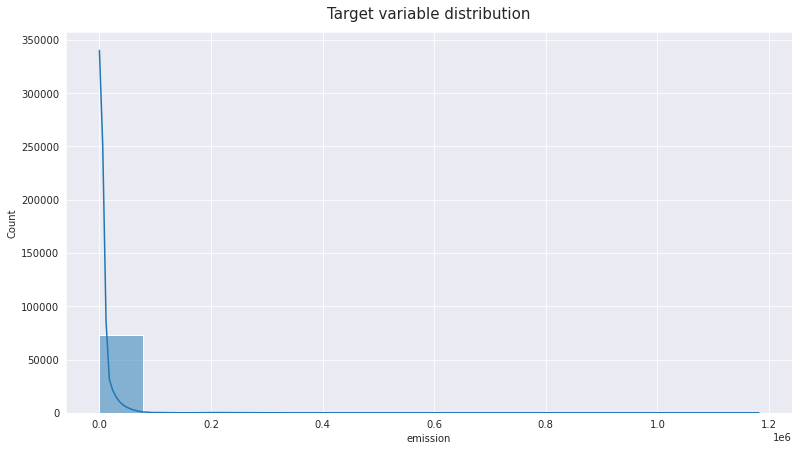

None

17.038027449698163

In [113]:
# Target variable distribution
sns.set_style('darkgrid')
plt.figure(figsize = (13, 7))
sns.histplot(train.emission, kde = True, bins = 15)
plt.title('Target variable distribution', y = 1.02, fontsize = 15)
display(plt.show(), train.emission.skew())

In [114]:
train.emission.describe()

count     74005.00000
mean       7891.06097
std       52571.60466
min           0.04806
25%         154.54720
50%         723.13586
75%        2773.02930
max     1181701.20000
Name: emission, dtype: float64

The target variable is skewed to the right with a a degree of ~17.

Some of the techniques used to handle skewness include:
- Log transform
- Box-cox transform
- Square root transform
- *etc*

<a name="Outliers"></a>
## 4. Outliers


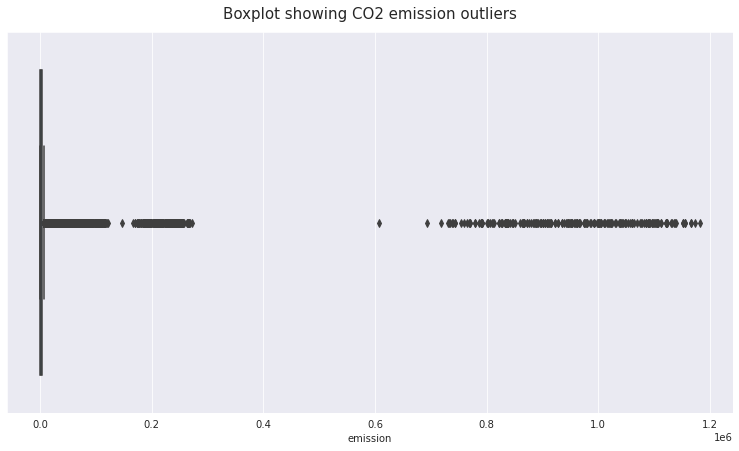

In [115]:
# Plotting boxplot for the CO2 emissions
sns.set_style('darkgrid')
plt.figure(figsize = (13, 7))
sns.boxplot(train.emission)
plt.title('Boxplot showing CO2 emission outliers', y = 1.02, fontsize = 15)  
plt.show()

Outliers are those data points which differ significantly from other observations present in given dataset.

Suggestions on how to handle outliers:
 - Transforming the outliers by scaling - log transformation, box-cox transformation ...
 - Dropping outliers
 - Imputation by replacing outliers with mean, median ...
 

<a name="Geo"></a>
## 5. Geo Visualisation - EDA

In [116]:
# Combine train and test for easy visualisation
train_coords = train.drop_duplicates(subset = ['latitude', 'longitude'])
test_coords = test.drop_duplicates(subset = ['latitude', 'longitude'])
train_coords['set_type'], test_coords['set_type'] = 'train', 'test'

all_data = pd.concat([train_coords, test_coords], ignore_index = True)
# Create point geometries

geometry = gpd.points_from_xy(all_data.longitude, all_data.latitude)
geo_df = gpd.GeoDataFrame(
    all_data[["latitude", "longitude", "set_type"]], geometry=geometry
)

# Preview the geopandas df
geo_df.head()

,latitude,longitude,set_type,geometry
0,-23.73000,28.77000,train,POINT (28.77000 -23.73000)
1,-23.73000,28.77000,train,POINT (28.77000 -23.73000)
2,-23.73000,28.87000,train,POINT (28.87000 -23.73000)
3,-23.73000,28.87000,train,POINT (28.87000 -23.73000)
4,-23.73000,28.97000,train,POINT (28.97000 -23.73000)


In [117]:
# Create a canvas to plot your map on
all_data_map = folium.Map(prefer_canvas=True)

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in geo_df.geometry]

# Iterate through list and add a marker for each volcano, color-coded by its type.
i = 0
for coordinates in geo_df_list:
    # assign a color marker for the type set
    if geo_df.set_type[i] == "train":
        type_color = "green"
    elif geo_df.set_type[i] == "test":
        type_color = "orange"

    # Place the markers 
    all_data_map.add_child(
        folium.CircleMarker(
            location=coordinates,
            radius = 1,
            weight = 4,
            zoom =10,
            popup= 
            "Set: " + str(geo_df.set_type[i]) + "<br>"
            "Coordinates: " + str([round(x, 2) for x in geo_df_list[i]]),
            color =  type_color),
        )
    i = i + 1
all_data_map.fit_bounds(all_data_map.get_bounds())
all_data_map

<a name="Missing"></a>
## 6. Missing values and duplicates

In [118]:
# Check for missing values
train.isnull().sum().any(), test.isnull().sum().any() 

(True, True)

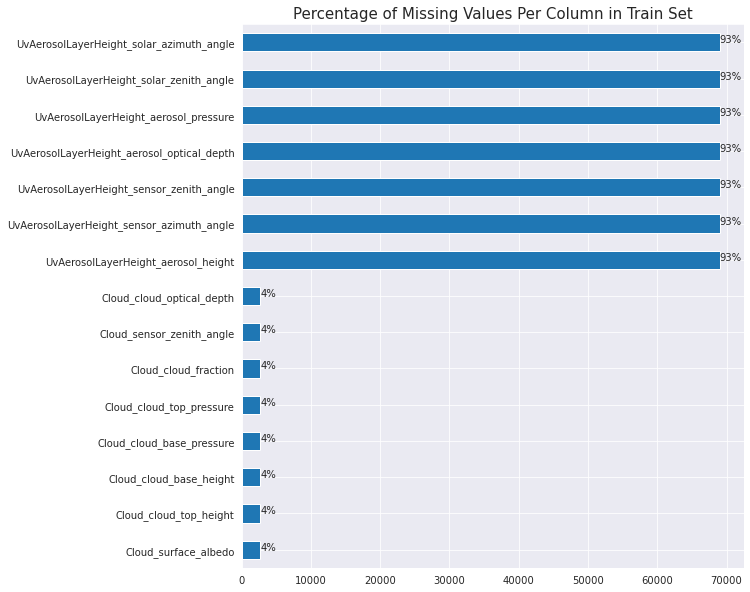

In [119]:
# Plot missing values in train set
ax = train.isna().sum().sort_values(ascending = False)[:15][::-1].plot(kind = 'barh', figsize = (9, 10))
plt.title('Percentage of Missing Values Per Column in Train Set', fontdict={'size':15})
for p in ax.patches:
    percentage ='{:,.0f}%'.format((p.get_width()/train.shape[0])*100)
    width, height =p.get_width(),p.get_height()
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y))

Suggestions on how to handle missing values:
 - Fill in missing values with mode, mean, median..
 - Drop Missing datapoints with missing values
 - Fill in with a large number e.g -999999

In [120]:
train.columns[train.isnull().mean() > 0.3]

Index(['UvAerosolLayerHeight_aerosol_height',
       'UvAerosolLayerHeight_aerosol_pressure',
       'UvAerosolLayerHeight_aerosol_optical_depth',
       'UvAerosolLayerHeight_sensor_zenith_angle',
       'UvAerosolLayerHeight_sensor_azimuth_angle',
       'UvAerosolLayerHeight_solar_azimuth_angle',
       'UvAerosolLayerHeight_solar_zenith_angle'],
      dtype='object')

In [121]:
def drop_null(dataframe):
    drop_columns = dataframe.columns[dataframe.isnull().mean() > 0.3]
    for column in drop_columns:
        percen_null = dataframe[column].isnull().mean()
        print("Column: ", column, " Percentage null: ", percen_null*100)
    dataframe.drop(drop_columns, axis = 1, inplace = True)
drop_null(train)
drop_null(test)

Column:  UvAerosolLayerHeight_aerosol_height  Percentage null:  93.27342747111682
Column:  UvAerosolLayerHeight_aerosol_pressure  Percentage null:  93.27342747111682
Column:  UvAerosolLayerHeight_aerosol_optical_depth  Percentage null:  93.27342747111682
Column:  UvAerosolLayerHeight_sensor_zenith_angle  Percentage null:  93.27342747111682
Column:  UvAerosolLayerHeight_sensor_azimuth_angle  Percentage null:  93.27342747111682
Column:  UvAerosolLayerHeight_solar_azimuth_angle  Percentage null:  93.27342747111682
Column:  UvAerosolLayerHeight_solar_zenith_angle  Percentage null:  93.27342747111682
Column:  UvAerosolLayerHeight_aerosol_height  Percentage null:  93.48406622752358
Column:  UvAerosolLayerHeight_aerosol_pressure  Percentage null:  93.48406622752358
Column:  UvAerosolLayerHeight_aerosol_optical_depth  Percentage null:  93.48406622752358
Column:  UvAerosolLayerHeight_sensor_zenith_angle  Percentage null:  93.48406622752358
Column:  UvAerosolLayerHeight_sensor_azimuth_angle  Per

In [122]:
def fill_null(dataframe):
    columns = dataframe.columns[dataframe.isnull().mean() > 0]
    for col in columns:
        is_null_col = round(dataframe[col].isnull().mean() * 100, 2)
        print("Column: ", col, " Percentage null: ", is_null_col)
    dataframe[columns] = dataframe[columns].fillna(dataframe[columns].mean())
fill_null(train)
fill_null(test)

Column:  SulphurDioxide_SO2_column_number_density  Percentage null:  2.61
Column:  SulphurDioxide_SO2_column_number_density_amf  Percentage null:  2.61
Column:  SulphurDioxide_SO2_slant_column_number_density  Percentage null:  2.61
Column:  SulphurDioxide_cloud_fraction  Percentage null:  2.61
Column:  SulphurDioxide_sensor_azimuth_angle  Percentage null:  2.61
Column:  SulphurDioxide_sensor_zenith_angle  Percentage null:  2.61
Column:  SulphurDioxide_solar_azimuth_angle  Percentage null:  2.61
Column:  SulphurDioxide_solar_zenith_angle  Percentage null:  2.61
Column:  SulphurDioxide_SO2_column_number_density_15km  Percentage null:  2.61
Column:  CarbonMonoxide_CO_column_number_density  Percentage null:  0.75
Column:  CarbonMonoxide_H2O_column_number_density  Percentage null:  0.75
Column:  CarbonMonoxide_cloud_height  Percentage null:  0.75
Column:  CarbonMonoxide_sensor_altitude  Percentage null:  0.75
Column:  CarbonMonoxide_sensor_azimuth_angle  Percentage null:  0.75
Column:  Carb

In [123]:
train.columns[train.isnull().sum() > 0]

Index([], dtype='object')

In [124]:
# Check for duplicates
train.duplicated().any(), test.duplicated().any()

(False, False)

<a name="Dates"></a>
## 7. Date features EDA

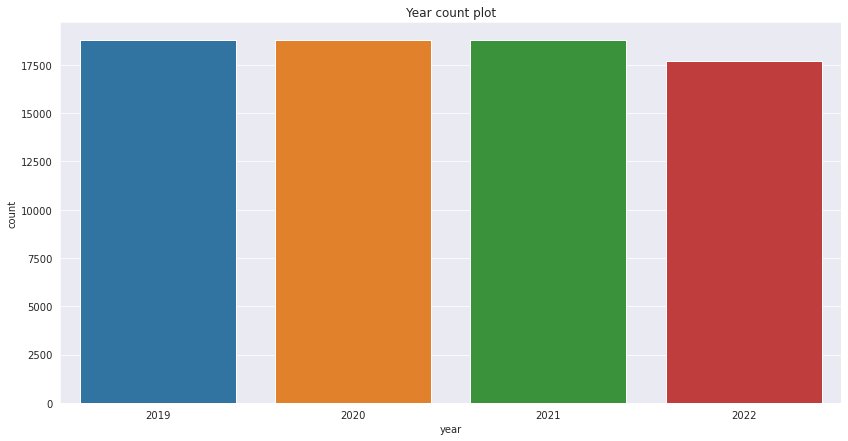

In [125]:
# Year countplot
plt.figure(figsize = (14, 7))
sns.countplot(x = 'year', data = train)
plt.title('Year count plot')
plt.show()

- The number of observations of CO2 emissions are relatively the same across the years
- Year 2022 has fewer number of observations

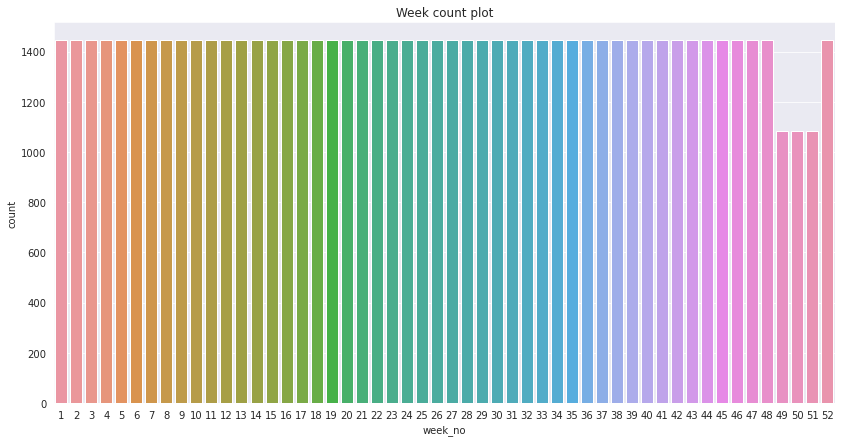

In [126]:
# Week countplot
plt.figure(figsize = (14, 7))
sns.countplot(x = 'week_no', data = train)
plt.title('Week count plot')
plt.show()

- The number of observations of CO2 emissions are relatively the same across the weeks
- Weeks 49, 50 and 51  have fewer number of observations when compared to the other weeks

In [127]:
train.drop_duplicates(subset = ['year', 'week_no']).groupby(['year'])[['week_no']].count()

,week_no
year,
2019,52
2020,52
2021,52
2022,49


- The year 2022 has only 49 weeks available in the data

<a name="Correlations"></a>
## 8. Correlations - EDA

In [128]:
# Top 20 correlated features to the target
top20_corrs = abs(train.corr()['emission']).sort_values(ascending = False).head(23)
top20_corrs

emission                                                 1.00000
NitrogenDioxide_NO2_column_number_density                0.28187
NitrogenDioxide_tropospheric_NO2_column_number_density   0.27772
NitrogenDioxide_NO2_slant_column_number_density          0.23891
SulphurDioxide_SO2_column_number_density_15km            0.07087
SulphurDioxide_SO2_slant_column_number_density           0.06484
SulphurDioxide_SO2_column_number_density                 0.05883
Cloud_surface_albedo                                     0.05701
longitude                                                0.05394
UvAerosolIndex_sensor_altitude                           0.04477
latitude                                                 0.04372
NitrogenDioxide_sensor_altitude                          0.03977
CarbonMonoxide_sensor_altitude                           0.03761
SulphurDioxide_SO2_column_number_density_amf             0.03115
CarbonMonoxide_H2O_column_number_density                 0.02483
Formaldehyde_HCHO_slant_c

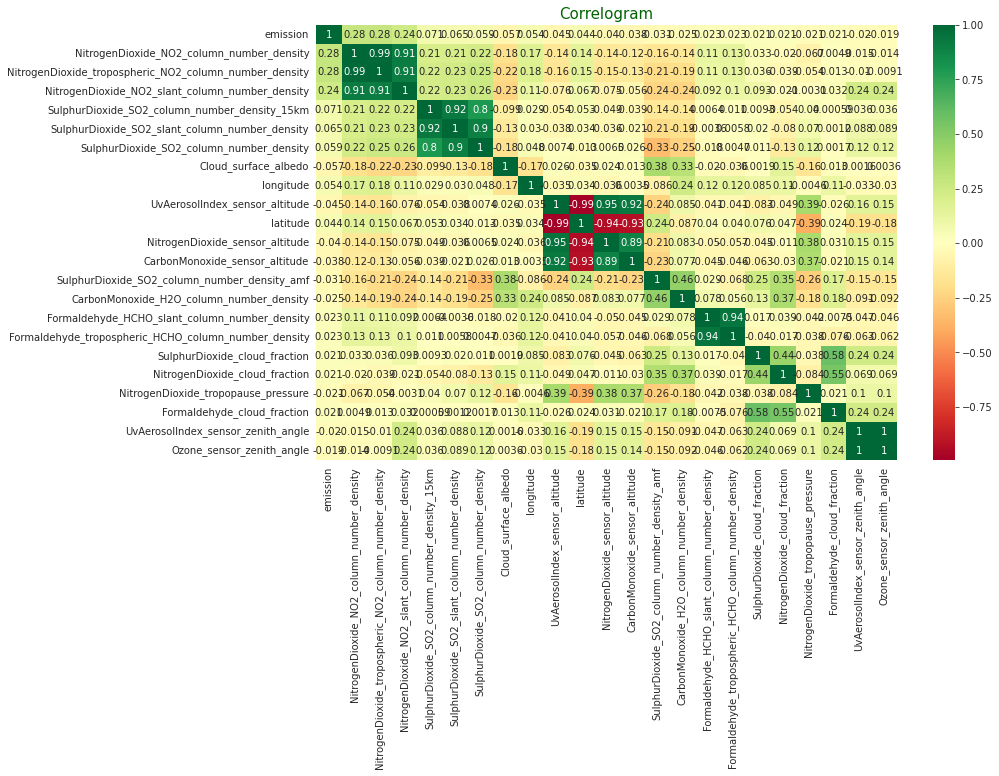

In [129]:
# Quantify correlations between features
corr = train[list(top20_corrs.index)].corr()
plt.figure(figsize = (13, 8))
sns.heatmap(corr, cmap='RdYlGn', annot = True, center = 0)
plt.title('Correlogram', fontsize = 15, color = 'darkgreen')
plt.show()

<a name="Timeseries"></a>
## 9. Timeseries visualization - EDA

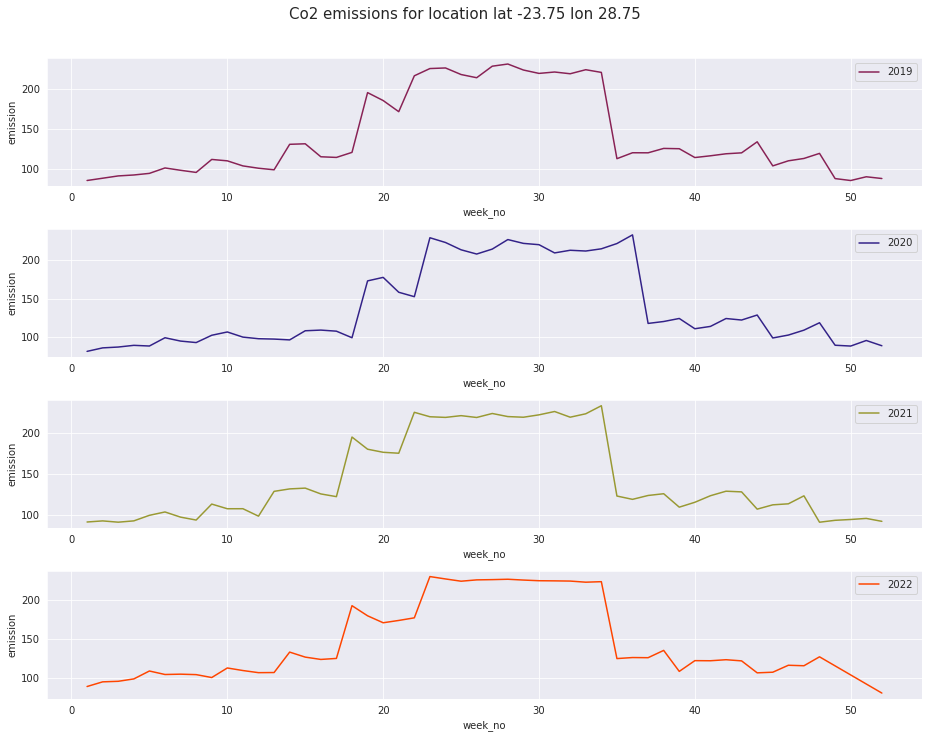

In [130]:
# Sample a unique location and visualize its emissions across the years
train.latitude, train.longitude = round(train.latitude, 2), round(train.longitude, 2)
sample_loc = train[(train.latitude == -23.73) & (train.longitude == 28.77)]

# Plot a line plot
sns.set_style('darkgrid')
fig, axes = plt.subplots(nrows = 4, ncols = 1, figsize = (13, 10))
fig.suptitle('Co2 emissions for location lat -23.75 lon 28.75', y=1.02, fontsize = 15)

for ax, data, year, color, in zip(axes.flatten(), sample_loc, sample_loc.year.unique(), ['#882255','#332288', '#999933' , 'orangered']):
  df = sample_loc[sample_loc.year == year]
  sns.lineplot(df.week_no, df.emission, ax = ax, label = year, color = color)
plt.legend()
plt.tight_layout()

In [131]:
train['outliers'] = train['emission'].apply(lambda x:0 if x < 400000 else 1)

## Idea 1

In [132]:
X = train.drop(['ID_LAT_LON_YEAR_WEEK','emission','outliers'], axis = 1).fillna(0)
y = train.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

model = LGBMRegressor()
# model = XGBRegressor()
# model = RandomForestRegressor(max_depth = 3)
model1 = CatBoostRegressor()
model.fit(X_train, y_train)
model1.fit(X_train, y_train)

    # Local score
y_pred = model.predict(X_test)
score = mean_squared_error(y_test, y_pred, squared=False)
    
print('Local RMSE:', score)

Learning rate set to 0.080808
0:	learn: 48882.7941032	total: 1.94s	remaining: 32m 13s
1:	learn: 45471.5771528	total: 1.97s	remaining: 16m 20s
2:	learn: 42367.7002057	total: 2s	remaining: 11m 3s
3:	learn: 39471.2865966	total: 2.02s	remaining: 8m 23s
4:	learn: 36882.5962719	total: 2.05s	remaining: 6m 47s
5:	learn: 34398.1534317	total: 2.07s	remaining: 5m 43s
6:	learn: 32213.4214680	total: 2.1s	remaining: 4m 57s
7:	learn: 30163.2946346	total: 2.12s	remaining: 4m 23s
8:	learn: 28368.9659784	total: 2.15s	remaining: 3m 57s
9:	learn: 26669.5300404	total: 2.19s	remaining: 3m 36s
10:	learn: 25147.3126002	total: 2.23s	remaining: 3m 20s
11:	learn: 23786.5888121	total: 2.25s	remaining: 3m 5s
12:	learn: 22540.6205695	total: 2.28s	remaining: 2m 53s
13:	learn: 21427.7360142	total: 2.31s	remaining: 2m 42s
14:	learn: 20462.9063893	total: 2.33s	remaining: 2m 33s
15:	learn: 19582.6036451	total: 2.36s	remaining: 2m 25s
16:	learn: 18803.3758187	total: 2.39s	remaining: 2m 18s
17:	learn: 18096.6921808	total:

154:	learn: 6323.0458671	total: 6.53s	remaining: 35.6s
155:	learn: 6315.4820525	total: 6.57s	remaining: 35.5s
156:	learn: 6243.2815346	total: 6.6s	remaining: 35.4s
157:	learn: 6205.4410354	total: 6.64s	remaining: 35.4s
158:	learn: 6194.5905574	total: 6.67s	remaining: 35.3s
159:	learn: 6187.0880339	total: 6.7s	remaining: 35.2s
160:	learn: 6148.2362970	total: 6.76s	remaining: 35.2s
161:	learn: 6111.5971203	total: 6.79s	remaining: 35.1s
162:	learn: 6103.1157947	total: 6.84s	remaining: 35.1s
163:	learn: 6097.5757307	total: 6.87s	remaining: 35s
164:	learn: 6085.3699000	total: 6.92s	remaining: 35s
165:	learn: 6079.1220995	total: 6.96s	remaining: 34.9s
166:	learn: 6073.9144418	total: 6.98s	remaining: 34.8s
167:	learn: 6014.0134403	total: 7s	remaining: 34.7s
168:	learn: 6009.8639721	total: 7.03s	remaining: 34.6s
169:	learn: 5991.6688943	total: 7.06s	remaining: 34.5s
170:	learn: 5963.2901039	total: 7.08s	remaining: 34.3s
171:	learn: 5959.2731806	total: 7.11s	remaining: 34.2s
172:	learn: 5951.99

308:	learn: 4422.5500118	total: 11.2s	remaining: 25.1s
309:	learn: 4410.8332749	total: 11.3s	remaining: 25.2s
310:	learn: 4392.9730118	total: 11.3s	remaining: 25.1s
311:	learn: 4389.3652542	total: 11.4s	remaining: 25.1s
312:	learn: 4386.2097213	total: 11.4s	remaining: 25.1s
313:	learn: 4382.9788404	total: 11.5s	remaining: 25.1s
314:	learn: 4374.8025314	total: 11.5s	remaining: 25s
315:	learn: 4372.3189335	total: 11.5s	remaining: 24.9s
316:	learn: 4369.3420612	total: 11.6s	remaining: 24.9s
317:	learn: 4358.9648501	total: 11.6s	remaining: 24.8s
318:	learn: 4356.4127047	total: 11.6s	remaining: 24.8s
319:	learn: 4353.0453011	total: 11.6s	remaining: 24.7s
320:	learn: 4333.9169607	total: 11.7s	remaining: 24.7s
321:	learn: 4330.1190532	total: 11.7s	remaining: 24.6s
322:	learn: 4321.2806442	total: 11.7s	remaining: 24.6s
323:	learn: 4316.3411398	total: 11.7s	remaining: 24.5s
324:	learn: 4314.4891191	total: 11.8s	remaining: 24.4s
325:	learn: 4311.2212228	total: 11.8s	remaining: 24.4s
326:	learn: 

465:	learn: 3720.5718756	total: 15.8s	remaining: 18.1s
466:	learn: 3719.5393087	total: 15.8s	remaining: 18.1s
467:	learn: 3717.5485089	total: 15.9s	remaining: 18s
468:	learn: 3716.1259067	total: 15.9s	remaining: 18s
469:	learn: 3711.7681293	total: 15.9s	remaining: 18s
470:	learn: 3710.3824688	total: 16s	remaining: 17.9s
471:	learn: 3708.7824053	total: 16s	remaining: 17.9s
472:	learn: 3700.6442551	total: 16.1s	remaining: 17.9s
473:	learn: 3698.4700015	total: 16.1s	remaining: 17.8s
474:	learn: 3696.7181063	total: 16.1s	remaining: 17.8s
475:	learn: 3692.0563468	total: 16.1s	remaining: 17.8s
476:	learn: 3675.5754194	total: 16.2s	remaining: 17.7s
477:	learn: 3675.0471095	total: 16.2s	remaining: 17.7s
478:	learn: 3671.6135363	total: 16.3s	remaining: 17.7s
479:	learn: 3660.4983738	total: 16.3s	remaining: 17.7s
480:	learn: 3659.5702043	total: 16.3s	remaining: 17.6s
481:	learn: 3658.3165891	total: 16.4s	remaining: 17.6s
482:	learn: 3656.9508488	total: 16.4s	remaining: 17.5s
483:	learn: 3636.154

620:	learn: 3279.9411554	total: 20.3s	remaining: 12.4s
621:	learn: 3278.6305041	total: 20.3s	remaining: 12.4s
622:	learn: 3277.3712610	total: 20.4s	remaining: 12.3s
623:	learn: 3276.3731731	total: 20.4s	remaining: 12.3s
624:	learn: 3274.2622196	total: 20.4s	remaining: 12.3s
625:	learn: 3272.9016952	total: 20.4s	remaining: 12.2s
626:	learn: 3271.8604875	total: 20.5s	remaining: 12.2s
627:	learn: 3270.6635044	total: 20.5s	remaining: 12.1s
628:	learn: 3267.6938372	total: 20.5s	remaining: 12.1s
629:	learn: 3264.8443048	total: 20.6s	remaining: 12.1s
630:	learn: 3259.4346144	total: 20.6s	remaining: 12s
631:	learn: 3258.1408965	total: 20.6s	remaining: 12s
632:	learn: 3257.5316681	total: 20.6s	remaining: 12s
633:	learn: 3246.2764347	total: 20.7s	remaining: 11.9s
634:	learn: 3239.0272462	total: 20.7s	remaining: 11.9s
635:	learn: 3238.4043774	total: 20.7s	remaining: 11.8s
636:	learn: 3237.7088395	total: 20.7s	remaining: 11.8s
637:	learn: 3236.7969899	total: 20.8s	remaining: 11.8s
638:	learn: 3235

772:	learn: 2912.9082806	total: 24.6s	remaining: 7.23s
773:	learn: 2911.8813160	total: 24.7s	remaining: 7.2s
774:	learn: 2911.3720820	total: 24.7s	remaining: 7.17s
775:	learn: 2910.7626667	total: 24.7s	remaining: 7.14s
776:	learn: 2909.0798678	total: 24.8s	remaining: 7.1s
777:	learn: 2905.9735025	total: 24.8s	remaining: 7.07s
778:	learn: 2905.1626855	total: 24.8s	remaining: 7.04s
779:	learn: 2904.3730679	total: 24.9s	remaining: 7.01s
780:	learn: 2902.5841098	total: 24.9s	remaining: 6.98s
781:	learn: 2902.2049756	total: 24.9s	remaining: 6.95s
782:	learn: 2901.1665581	total: 24.9s	remaining: 6.91s
783:	learn: 2899.9889113	total: 25s	remaining: 6.88s
784:	learn: 2898.6923830	total: 25s	remaining: 6.85s
785:	learn: 2897.5827088	total: 25s	remaining: 6.81s
786:	learn: 2895.8964495	total: 25.1s	remaining: 6.78s
787:	learn: 2891.9012820	total: 25.1s	remaining: 6.75s
788:	learn: 2889.7680791	total: 25.1s	remaining: 6.71s
789:	learn: 2887.9624575	total: 25.1s	remaining: 6.68s
790:	learn: 2865.1

924:	learn: 2637.6936328	total: 28.9s	remaining: 2.34s
925:	learn: 2636.9663868	total: 28.9s	remaining: 2.31s
926:	learn: 2632.7238606	total: 29s	remaining: 2.28s
927:	learn: 2632.3550364	total: 29s	remaining: 2.25s
928:	learn: 2631.8438635	total: 29s	remaining: 2.22s
929:	learn: 2631.1493691	total: 29s	remaining: 2.19s
930:	learn: 2629.7538124	total: 29.1s	remaining: 2.15s
931:	learn: 2625.6698928	total: 29.1s	remaining: 2.12s
932:	learn: 2624.5953900	total: 29.1s	remaining: 2.09s
933:	learn: 2622.9393934	total: 29.2s	remaining: 2.06s
934:	learn: 2621.3930599	total: 29.2s	remaining: 2.03s
935:	learn: 2621.0198172	total: 29.2s	remaining: 2s
936:	learn: 2620.2097219	total: 29.2s	remaining: 1.97s
937:	learn: 2618.8842634	total: 29.3s	remaining: 1.93s
938:	learn: 2617.3081461	total: 29.3s	remaining: 1.9s
939:	learn: 2616.2527991	total: 29.3s	remaining: 1.87s
940:	learn: 2614.8861251	total: 29.4s	remaining: 1.84s
941:	learn: 2614.5981859	total: 29.4s	remaining: 1.81s
942:	learn: 2612.53406

In [133]:
X = test.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)

In [134]:
pred = model.predict(X)
pred1 = model1.predict(X)


In [135]:
predictions = (pred+pred1)/2
len(predictions)

28085

In [136]:
predictions

array([2261.08091138, 1524.91045395, 1866.2264131 , ..., 5975.14142276,
       4681.34938986, 5891.93714877])

In [137]:
submission = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test['ID_LAT_LON_YEAR_WEEK'],
    'emission': predictions
})

In [138]:
submission.to_csv('submission_0001.csv', index = False)

## Idea 3

In [139]:
train.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,outliers
0,ID_-23.73_28.77_2019_1,-23.73000,28.77000,2019,1,0.00017,0.71317,0.00010,0.22393,24.93944,...,54826.03262,4606.20999,19.11528,0.35378,24.95195,49.05395,-89.63803,17.98887,86.05170,0
1,ID_-23.73_28.77_2019_2,-23.73000,28.77000,2019,2,-0.00016,0.81291,-0.00014,0.08028,16.62416,...,68491.75334,3034.46166,12.21866,0.24499,4.70886,42.58668,-89.90431,22.77325,88.87567,0
2,ID_-23.73_28.77_2019_3,-23.73000,28.77000,2019,3,-0.00007,0.86031,-0.00006,0.16105,-13.23724,...,78967.73955,1433.48259,6.06274,0.24510,76.06063,34.73754,-83.59525,17.43730,91.72311,0
3,ID_-23.73_28.77_2019_4,-23.73000,28.77000,2019,4,0.00015,0.42228,0.00009,0.04650,-13.53465,...,64592.80677,2878.51292,6.38823,0.21090,75.91237,60.29449,-71.89673,11.97782,92.88387,0
4,ID_-23.73_28.77_2019_5,-23.73000,28.77000,2019,5,0.00002,1.00458,0.00003,0.21425,-13.47572,...,86804.02539,1094.66534,9.20625,0.26110,-13.34608,50.19449,-77.46208,24.37427,94.87833,0


In [140]:
def draw_hist(dataframe1,dataframe2, rows, cols):
    xaxis = dataframe1.drop(['ID_LAT_LON_YEAR_WEEK', 'emission','outliers'] , axis = 1)
    x_axis = xaxis.columns
    fig = plt.figure(figsize = (20,100))
    for i, feature in enumerate(x_axis):
        ax = fig.add_subplot(rows, cols, i+1)
#         dataframe[feature].hist(bins=20,ax=ax,facecolor='midnightblue')
#         ax.hist(data = dataframe, x = feature, bins = 20)
        sns.histplot(data = dataframe1, x = feature, ax = ax, color = 'lightblue')
        sns.histplot(data = dataframe2, x = feature, ax = ax, color  = 'green')
        ax.set_title(feature + " Distribution")
    
    fig.tight_layout()
    plt.show()
    

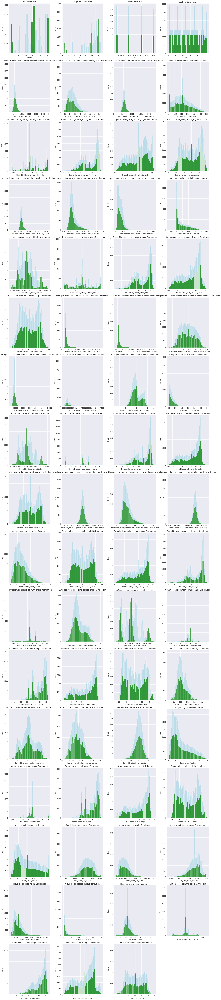

In [137]:
draw_hist(train,test, 18,4 )

In [141]:
def draw_scatter(dataframe, y_axis, rows, cols):
    xaxis = dataframe.drop(['ID_LAT_LON_YEAR_WEEK'] , axis = 1)
    x_axis = xaxis.columns
    fig = plt.figure(figsize = (20,100))
    for i, feature in enumerate(x_axis):
        ax = fig.add_subplot(rows, cols, i+1)
#         dataframe[feature].hist(bins=20,ax=ax,facecolor='midnightblue')
#         ax.hist(data = dataframe, x = feature, bins = 20)
        sns.scatterplot(data = dataframe, x = feature,y = y_axis, ax = ax, hue = 'outliers')
        ax.set_title(feature + " Distribution")
    
    fig.tight_layout()
    plt.show()

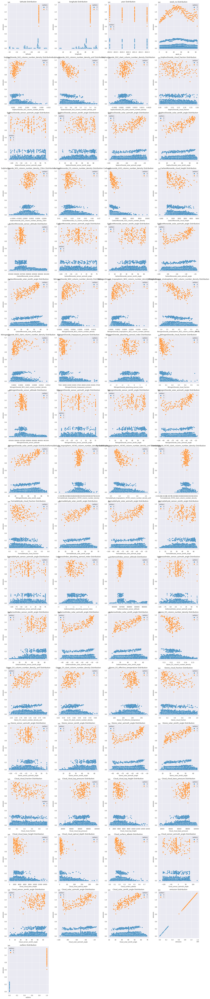

In [94]:
draw_scatter(train, 'emission', 18,4 )

## Idea 5

In [142]:
# sns.scatterplot(data = train, x = 'Cloud_surface_albedo', y = 'emission',hue = 'outliers')
# plt.xticks(rotation = 90);

In [143]:
train_outliers = train[train['SulphurDioxide_SO2_column_number_density'] < 0.004]
train_outliers = train_outliers[train_outliers['SulphurDioxide_SO2_column_number_density_amf'] < 0.8]
train_outliers = train_outliers[train_outliers['CarbonMonoxide_H2O_column_number_density'] < 2000]
train_outliers = train_outliers[train_outliers['CarbonMonoxide_sensor_altitude'] > 836000]
train_outliers = train_outliers[train_outliers['CarbonMonoxide_sensor_altitude'] < 837500]
train_outliers = train_outliers[train_outliers['NitrogenDioxide_tropopause_pressure'] > 7500]
train_outliers = train_outliers[train_outliers['NitrogenDioxide_tropopause_pressure'] < 11000]
train_outliers = train_outliers[train_outliers['NitrogenDioxide_cloud_fraction'] < 0.1]
train_outliers = train_outliers[train_outliers['NitrogenDioxide_sensor_altitude'] > 836000]
train_outliers = train_outliers[train_outliers['NitrogenDioxide_sensor_altitude'] < 837500]

train_outliers = train_outliers[train_outliers['Formaldehyde_tropospheric_HCHO_column_number_density'] > 0]
train_outliers = train_outliers[train_outliers['Formaldehyde_tropospheric_HCHO_column_number_density'] < 0.00025]
train_outliers = train_outliers[train_outliers['Formaldehyde_HCHO_slant_column_number_density'] < 0.00025]
train_outliers = train_outliers[train_outliers['Formaldehyde_HCHO_slant_column_number_density'] < 0.00025]
train_outliers = train_outliers[train_outliers['UvAerosolIndex_sensor_altitude'] < 837000]
train_outliers = train_outliers[train_outliers['UvAerosolIndex_sensor_altitude'] < 836200]
train_outliers = train_outliers[train_outliers['Cloud_cloud_optical_depth'] < 30]
train_outliers = train_outliers[train_outliers['Cloud_surface_albedo'] < 0.3]
train_outliers = train_outliers[train_outliers['Cloud_surface_albedo'] > 0.1]


train_inliers = train.drop(train_outliers.index, axis = 0)
train_inliers.shape
train_outliers.shape

(2204, 70)

In [144]:
test_outliers = test[test['SulphurDioxide_SO2_column_number_density'] < 0.004]
test_outliers = test_outliers[test_outliers['SulphurDioxide_SO2_column_number_density_amf'] < 0.8]
test_outliers = test_outliers[test_outliers['CarbonMonoxide_H2O_column_number_density'] < 2000]
test_outliers = test_outliers[test_outliers['CarbonMonoxide_sensor_altitude'] > 836000]
test_outliers = test_outliers[test_outliers['CarbonMonoxide_sensor_altitude'] < 837500]
test_outliers = test_outliers[test_outliers['NitrogenDioxide_tropopause_pressure'] > 7500]
test_outliers = test_outliers[test_outliers['NitrogenDioxide_tropopause_pressure'] < 11000]
test_outliers = test_outliers[test_outliers['NitrogenDioxide_cloud_fraction'] < 0.1]
test_outliers = test_outliers[test_outliers['NitrogenDioxide_sensor_altitude'] > 836000]
test_outliers = test_outliers[test_outliers['NitrogenDioxide_sensor_altitude'] < 837500]

test_outliers = test_outliers[test_outliers['Formaldehyde_tropospheric_HCHO_column_number_density'] > 0]
test_outliers = test_outliers[test_outliers['Formaldehyde_tropospheric_HCHO_column_number_density'] < 0.00025]
test_outliers = test_outliers[test_outliers['Formaldehyde_HCHO_slant_column_number_density'] < 0.00025]
test_outliers = test_outliers[test_outliers['Formaldehyde_HCHO_slant_column_number_density'] < 0.00025]
test_outliers = test_outliers[test_outliers['UvAerosolIndex_sensor_altitude'] < 837000]
test_outliers = test_outliers[test_outliers['UvAerosolIndex_sensor_altitude'] < 836200]
test_outliers = test_outliers[test_outliers['Cloud_cloud_optical_depth'] < 30]
test_outliers = test_outliers[test_outliers['Cloud_surface_albedo'] < 0.3]
test_outliers = test_outliers[test_outliers['Cloud_surface_albedo'] > 0.1]

test_inliers = test.drop(test_outliers.index, axis = 0)
test_outliers.shape
test_outliers.shape

(659, 68)

In [145]:
train.columns

Index(['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no',
       'SulphurDioxide_SO2_column_number_density',
       'SulphurDioxide_SO2_column_number_density_amf',
       'SulphurDioxide_SO2_slant_column_number_density',
       'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle',
       'SulphurDioxide_sensor_zenith_angle',
       'SulphurDioxide_solar_azimuth_angle',
       'SulphurDioxide_solar_zenith_angle',
       'SulphurDioxide_SO2_column_number_density_15km',
       'CarbonMonoxide_CO_column_number_density',
       'CarbonMonoxide_H2O_column_number_density',
       'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude',
       'CarbonMonoxide_sensor_azimuth_angle',
       'CarbonMonoxide_sensor_zenith_angle',
       'CarbonMonoxide_solar_azimuth_angle',
       'CarbonMonoxide_solar_zenith_angle',
       'NitrogenDioxide_NO2_column_number_density',
       'NitrogenDioxide_tropospheric_NO2_column_number_density',
       'NitrogenDioxide

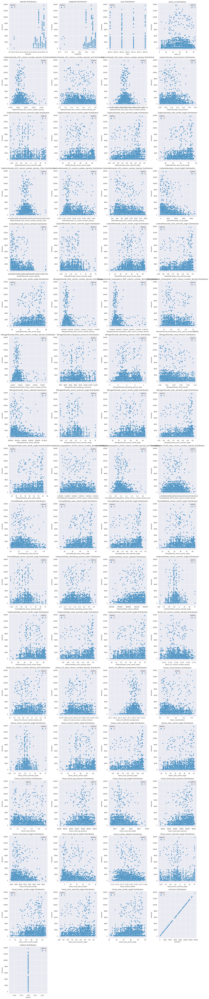

In [146]:
draw_scatter(train_outliers, 'emission', 18,4 )

<AxesSubplot:xlabel='emission', ylabel='Count'>

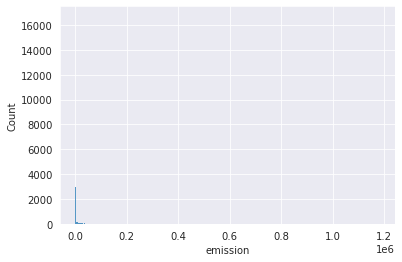

In [147]:
sns.histplot(data = train, x = 'emission')

In [148]:
train_outliers['outliers'].value_counts()

0    2204
Name: outliers, dtype: int64

In [149]:
train_x = train_inliers[train_inliers['latitude'] > -25]
test_x = test_inliers[test_inliers['latitude'] > -25]
test_x.shape
train_y = train_inliers[train_inliers['latitude'] > -29]
train_y = train_y[train_y['latitude'] < -27]
# train_y = train_y[train_y['longitude'] > 29]
test_y = test_inliers[test_inliers['longitude'] > 29]
test_y.shape
train_z = train_inliers[train_inliers['latitude'] < -33]
test_z = test_inliers[test_inliers['latitude'] < -33]
test_z.shape
X = train_x.drop(['ID_LAT_LON_YEAR_WEEK','emission','outliers'], axis = 1).fillna(0)
y = train_x.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

# model = LGBMRegressor()
model = CatBoostRegressor()
model.fit(X_train, y_train)

    # Local score
X = test_x.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
pred_x= model.predict(X)

X = train_y.drop(['ID_LAT_LON_YEAR_WEEK','emission', 'outliers'], axis = 1).fillna(0)
y = train_y.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

# model = LGBMRegressor()
model = CatBoostRegressor()
model.fit(X_train, y_train)

    # Local score
X = test_y.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
pred_y= model.predict(X)


X = train_z.drop(['ID_LAT_LON_YEAR_WEEK','emission', 'outliers'], axis = 1).fillna(0)
y = train_z.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

# model = LGBMRegressor()
model = CatBoostRegressor()
model.fit(X_train, y_train)

    # Local score
X = test_z.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
pred_z= model.predict(X)

submission_x = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test_x['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred_x
})
submission_y = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test_y['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred_y
})
submission_z = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test_z['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred_z
})
frames = [submission_x, submission_y, submission_z]
submission = pd.concat(frames)

predictions_in_order = []
for i in test_inliers['ID_LAT_LON_YEAR_WEEK']:
    prediction_for_id = submission.emission[submission["ID_LAT_LON_YEAR_WEEK"] == i]
    predictions_in_order.append(prediction_for_id)

pred = []
for i in predictions_in_order:
    for j in i.values:
        pred.append(j)
pred

submission_inliers = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test_inliers['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred
})



# X = train_inliers.drop(['ID_LAT_LON_YEAR_WEEK','emission', 'outliers'], axis = 1).fillna(0)
# y = train_inliers.emission
    

# # Splitting the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

# # model = LGBMRegressor()
# model = CatBoostRegressor()
# model.fit(X_train, y_train)

# X = test_inliers.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
# y_pred_inliers = model.predict(X)
#     # Local score
# # y_pred = model.predict(X_test)
# # score = mean_squared_error(y_test, y_pred, squared=False)
    
# # print('Local RMSE:', score)
# submission_inliers = pd.DataFrame({
#     "ID_LAT_LON_YEAR_WEEK" : test_inliers['ID_LAT_LON_YEAR_WEEK'],
#     'emission' : y_pred_inliers
# })
# submission_inliers.head()

Learning rate set to 0.062255
0:	learn: 1911.4918900	total: 150ms	remaining: 2m 30s
1:	learn: 1842.6398403	total: 184ms	remaining: 1m 31s
2:	learn: 1792.2347226	total: 209ms	remaining: 1m 9s
3:	learn: 1733.7293983	total: 227ms	remaining: 56.5s
4:	learn: 1680.4933208	total: 244ms	remaining: 48.6s
5:	learn: 1632.1487073	total: 262ms	remaining: 43.4s
6:	learn: 1588.3333345	total: 281ms	remaining: 39.8s
7:	learn: 1548.7006907	total: 296ms	remaining: 36.7s
8:	learn: 1512.6272086	total: 311ms	remaining: 34.2s
9:	learn: 1477.8633746	total: 325ms	remaining: 32.1s
10:	learn: 1447.3395546	total: 339ms	remaining: 30.5s
11:	learn: 1418.4097170	total: 355ms	remaining: 29.2s
12:	learn: 1373.2866303	total: 373ms	remaining: 28.3s
13:	learn: 1326.1522879	total: 390ms	remaining: 27.5s
14:	learn: 1302.2791441	total: 408ms	remaining: 26.8s
15:	learn: 1259.3331912	total: 426ms	remaining: 26.2s
16:	learn: 1220.2501759	total: 444ms	remaining: 25.7s
17:	learn: 1184.7539351	total: 462ms	remaining: 25.2s
18:	le

162:	learn: 346.2047603	total: 2.9s	remaining: 14.9s
163:	learn: 344.9189342	total: 2.92s	remaining: 14.9s
164:	learn: 344.3482879	total: 2.94s	remaining: 14.9s
165:	learn: 341.4519491	total: 2.95s	remaining: 14.8s
166:	learn: 336.6728347	total: 2.97s	remaining: 14.8s
167:	learn: 334.4639391	total: 2.98s	remaining: 14.8s
168:	learn: 332.8390337	total: 3s	remaining: 14.7s
169:	learn: 331.5793182	total: 3.01s	remaining: 14.7s
170:	learn: 327.3184348	total: 3.03s	remaining: 14.7s
171:	learn: 324.7717918	total: 3.04s	remaining: 14.6s
172:	learn: 324.5491018	total: 3.06s	remaining: 14.6s
173:	learn: 323.0949177	total: 3.07s	remaining: 14.6s
174:	learn: 319.2618355	total: 3.08s	remaining: 14.5s
175:	learn: 319.0952694	total: 3.1s	remaining: 14.5s
176:	learn: 317.5088521	total: 3.11s	remaining: 14.5s
177:	learn: 315.6777880	total: 3.13s	remaining: 14.5s
178:	learn: 314.0379994	total: 3.15s	remaining: 14.4s
179:	learn: 313.7879729	total: 3.16s	remaining: 14.4s
180:	learn: 312.9196906	total: 3.

326:	learn: 226.4623964	total: 5.61s	remaining: 11.5s
327:	learn: 226.3673742	total: 5.63s	remaining: 11.5s
328:	learn: 226.2397923	total: 5.65s	remaining: 11.5s
329:	learn: 226.1344357	total: 5.66s	remaining: 11.5s
330:	learn: 226.0708186	total: 5.68s	remaining: 11.5s
331:	learn: 225.8820470	total: 5.69s	remaining: 11.5s
332:	learn: 225.3901410	total: 5.71s	remaining: 11.4s
333:	learn: 225.3131963	total: 5.72s	remaining: 11.4s
334:	learn: 225.2108644	total: 5.74s	remaining: 11.4s
335:	learn: 224.9424255	total: 5.75s	remaining: 11.4s
336:	learn: 224.8321660	total: 5.77s	remaining: 11.4s
337:	learn: 224.6170375	total: 5.78s	remaining: 11.3s
338:	learn: 224.4400290	total: 5.8s	remaining: 11.3s
339:	learn: 224.2916222	total: 5.81s	remaining: 11.3s
340:	learn: 223.9566564	total: 5.83s	remaining: 11.3s
341:	learn: 223.6906620	total: 5.85s	remaining: 11.3s
342:	learn: 223.6243641	total: 5.86s	remaining: 11.2s
343:	learn: 223.1092424	total: 5.88s	remaining: 11.2s
344:	learn: 223.0528555	total

489:	learn: 188.2342322	total: 8.5s	remaining: 8.85s
490:	learn: 188.1938481	total: 8.52s	remaining: 8.84s
491:	learn: 188.1118604	total: 8.54s	remaining: 8.82s
492:	learn: 187.2606520	total: 8.56s	remaining: 8.8s
493:	learn: 187.1090114	total: 8.57s	remaining: 8.78s
494:	learn: 187.0547692	total: 8.59s	remaining: 8.77s
495:	learn: 186.9178874	total: 8.61s	remaining: 8.75s
496:	learn: 186.7850428	total: 8.62s	remaining: 8.73s
497:	learn: 186.1974557	total: 8.64s	remaining: 8.71s
498:	learn: 186.1234075	total: 8.66s	remaining: 8.69s
499:	learn: 186.0790631	total: 8.67s	remaining: 8.67s
500:	learn: 186.0483243	total: 8.69s	remaining: 8.65s
501:	learn: 185.9061090	total: 8.7s	remaining: 8.63s
502:	learn: 185.8386797	total: 8.72s	remaining: 8.61s
503:	learn: 185.1543319	total: 8.74s	remaining: 8.6s
504:	learn: 185.1051463	total: 8.75s	remaining: 8.58s
505:	learn: 184.9973625	total: 8.77s	remaining: 8.56s
506:	learn: 184.9635753	total: 8.78s	remaining: 8.54s
507:	learn: 184.8753371	total: 8

647:	learn: 163.5041232	total: 11.5s	remaining: 6.24s
648:	learn: 163.1031753	total: 11.5s	remaining: 6.23s
649:	learn: 163.0790847	total: 11.5s	remaining: 6.21s
650:	learn: 163.0209656	total: 11.5s	remaining: 6.19s
651:	learn: 162.9146705	total: 11.6s	remaining: 6.17s
652:	learn: 162.8436082	total: 11.6s	remaining: 6.16s
653:	learn: 162.7790962	total: 11.6s	remaining: 6.14s
654:	learn: 162.7019368	total: 11.6s	remaining: 6.12s
655:	learn: 162.2170409	total: 11.6s	remaining: 6.11s
656:	learn: 162.0762983	total: 11.7s	remaining: 6.09s
657:	learn: 162.0486633	total: 11.7s	remaining: 6.07s
658:	learn: 161.9829985	total: 11.7s	remaining: 6.06s
659:	learn: 161.9329845	total: 11.7s	remaining: 6.04s
660:	learn: 161.4229491	total: 11.8s	remaining: 6.03s
661:	learn: 160.9223445	total: 11.8s	remaining: 6.01s
662:	learn: 160.8728611	total: 11.8s	remaining: 5.99s
663:	learn: 160.4390076	total: 11.8s	remaining: 5.97s
664:	learn: 160.3844268	total: 11.8s	remaining: 5.95s
665:	learn: 160.3230180	tota

807:	learn: 149.4983559	total: 14.2s	remaining: 3.37s
808:	learn: 148.9978114	total: 14.2s	remaining: 3.35s
809:	learn: 148.9327304	total: 14.2s	remaining: 3.33s
810:	learn: 148.8781816	total: 14.2s	remaining: 3.31s
811:	learn: 148.8583028	total: 14.2s	remaining: 3.29s
812:	learn: 148.8269450	total: 14.2s	remaining: 3.28s
813:	learn: 148.7606739	total: 14.3s	remaining: 3.26s
814:	learn: 148.6967831	total: 14.3s	remaining: 3.24s
815:	learn: 148.2429063	total: 14.3s	remaining: 3.22s
816:	learn: 148.2032575	total: 14.3s	remaining: 3.21s
817:	learn: 148.1594569	total: 14.3s	remaining: 3.19s
818:	learn: 148.1134646	total: 14.3s	remaining: 3.17s
819:	learn: 148.0399027	total: 14.4s	remaining: 3.15s
820:	learn: 147.9820269	total: 14.4s	remaining: 3.13s
821:	learn: 147.9252031	total: 14.4s	remaining: 3.12s
822:	learn: 147.9034129	total: 14.4s	remaining: 3.1s
823:	learn: 147.8389144	total: 14.4s	remaining: 3.08s
824:	learn: 147.8130509	total: 14.4s	remaining: 3.06s
825:	learn: 147.7696143	total

966:	learn: 136.0234036	total: 16.8s	remaining: 574ms
967:	learn: 135.9585257	total: 16.9s	remaining: 557ms
968:	learn: 135.9069089	total: 16.9s	remaining: 540ms
969:	learn: 135.8294910	total: 16.9s	remaining: 522ms
970:	learn: 135.7808012	total: 16.9s	remaining: 505ms
971:	learn: 135.7333737	total: 16.9s	remaining: 487ms
972:	learn: 135.6909798	total: 16.9s	remaining: 470ms
973:	learn: 135.6588255	total: 16.9s	remaining: 452ms
974:	learn: 135.6286101	total: 17s	remaining: 435ms
975:	learn: 135.6007875	total: 17s	remaining: 418ms
976:	learn: 135.5403558	total: 17s	remaining: 400ms
977:	learn: 135.1618793	total: 17s	remaining: 383ms
978:	learn: 134.9733884	total: 17s	remaining: 366ms
979:	learn: 134.9293779	total: 17.1s	remaining: 348ms
980:	learn: 134.8759882	total: 17.1s	remaining: 331ms
981:	learn: 134.8409242	total: 17.1s	remaining: 313ms
982:	learn: 134.8052826	total: 17.1s	remaining: 296ms
983:	learn: 134.7385375	total: 17.2s	remaining: 279ms
984:	learn: 134.6823448	total: 17.2s	r

121:	learn: 219.7070096	total: 1.87s	remaining: 13.5s
122:	learn: 218.2295396	total: 1.89s	remaining: 13.5s
123:	learn: 217.2765773	total: 1.91s	remaining: 13.5s
124:	learn: 215.6544802	total: 1.93s	remaining: 13.5s
125:	learn: 215.0468342	total: 1.94s	remaining: 13.5s
126:	learn: 214.5433060	total: 1.96s	remaining: 13.5s
127:	learn: 213.3394451	total: 1.97s	remaining: 13.4s
128:	learn: 213.0575905	total: 1.99s	remaining: 13.4s
129:	learn: 210.3490677	total: 2s	remaining: 13.4s
130:	learn: 209.6458346	total: 2.01s	remaining: 13.4s
131:	learn: 207.4887551	total: 2.03s	remaining: 13.3s
132:	learn: 205.8288662	total: 2.04s	remaining: 13.3s
133:	learn: 204.8211282	total: 2.06s	remaining: 13.3s
134:	learn: 204.3012279	total: 2.07s	remaining: 13.3s
135:	learn: 204.2022694	total: 2.09s	remaining: 13.3s
136:	learn: 201.9948120	total: 2.11s	remaining: 13.3s
137:	learn: 201.1561056	total: 2.12s	remaining: 13.3s
138:	learn: 200.6116354	total: 2.15s	remaining: 13.3s
139:	learn: 198.5764601	total: 

285:	learn: 135.5162844	total: 4.98s	remaining: 12.4s
286:	learn: 135.4483612	total: 5s	remaining: 12.4s
287:	learn: 135.3372067	total: 5.02s	remaining: 12.4s
288:	learn: 134.8883069	total: 5.03s	remaining: 12.4s
289:	learn: 134.8017253	total: 5.05s	remaining: 12.4s
290:	learn: 134.7382190	total: 5.06s	remaining: 12.3s
291:	learn: 134.4681730	total: 5.08s	remaining: 12.3s
292:	learn: 134.3929251	total: 5.09s	remaining: 12.3s
293:	learn: 134.3407963	total: 5.11s	remaining: 12.3s
294:	learn: 133.7512346	total: 5.12s	remaining: 12.2s
295:	learn: 133.4990678	total: 5.14s	remaining: 12.2s
296:	learn: 133.3307042	total: 5.15s	remaining: 12.2s
297:	learn: 133.2196455	total: 5.17s	remaining: 12.2s
298:	learn: 132.9237450	total: 5.18s	remaining: 12.2s
299:	learn: 132.7983442	total: 5.2s	remaining: 12.1s
300:	learn: 132.7624013	total: 5.22s	remaining: 12.1s
301:	learn: 132.6239199	total: 5.24s	remaining: 12.1s
302:	learn: 132.5955143	total: 5.25s	remaining: 12.1s
303:	learn: 132.4743151	total: 5

442:	learn: 113.4441675	total: 7.67s	remaining: 9.65s
443:	learn: 113.4230062	total: 7.69s	remaining: 9.63s
444:	learn: 113.3624095	total: 7.71s	remaining: 9.62s
445:	learn: 113.3197678	total: 7.72s	remaining: 9.6s
446:	learn: 113.2628322	total: 7.74s	remaining: 9.58s
447:	learn: 113.2150988	total: 7.75s	remaining: 9.55s
448:	learn: 113.0036776	total: 7.77s	remaining: 9.54s
449:	learn: 112.9663625	total: 7.79s	remaining: 9.52s
450:	learn: 112.8775740	total: 7.8s	remaining: 9.49s
451:	learn: 112.7236029	total: 7.82s	remaining: 9.47s
452:	learn: 112.7064797	total: 7.83s	remaining: 9.45s
453:	learn: 112.6429629	total: 7.84s	remaining: 9.44s
454:	learn: 112.5813361	total: 7.86s	remaining: 9.41s
455:	learn: 112.4937501	total: 7.88s	remaining: 9.4s
456:	learn: 112.4797550	total: 7.89s	remaining: 9.38s
457:	learn: 112.4217125	total: 7.91s	remaining: 9.36s
458:	learn: 112.3811673	total: 7.93s	remaining: 9.34s
459:	learn: 112.2813042	total: 7.94s	remaining: 9.32s
460:	learn: 112.2290827	total: 

598:	learn: 100.5795423	total: 10.1s	remaining: 6.79s
599:	learn: 100.5590553	total: 10.2s	remaining: 6.77s
600:	learn: 100.5262763	total: 10.2s	remaining: 6.76s
601:	learn: 100.4622945	total: 10.2s	remaining: 6.74s
602:	learn: 100.4417948	total: 10.2s	remaining: 6.72s
603:	learn: 100.3454265	total: 10.2s	remaining: 6.7s
604:	learn: 100.3214186	total: 10.2s	remaining: 6.69s
605:	learn: 100.2893872	total: 10.3s	remaining: 6.67s
606:	learn: 100.2417407	total: 10.3s	remaining: 6.65s
607:	learn: 100.2104542	total: 10.3s	remaining: 6.63s
608:	learn: 100.1462716	total: 10.3s	remaining: 6.62s
609:	learn: 100.1227222	total: 10.3s	remaining: 6.6s
610:	learn: 100.1028116	total: 10.3s	remaining: 6.58s
611:	learn: 100.0710872	total: 10.3s	remaining: 6.56s
612:	learn: 99.9604159	total: 10.4s	remaining: 6.55s
613:	learn: 99.8839982	total: 10.4s	remaining: 6.53s
614:	learn: 99.8520444	total: 10.4s	remaining: 6.51s
615:	learn: 99.6453922	total: 10.4s	remaining: 6.49s
616:	learn: 99.6043393	total: 10.4

754:	learn: 90.0141401	total: 12.6s	remaining: 4.09s
755:	learn: 89.9865010	total: 12.6s	remaining: 4.08s
756:	learn: 89.9565324	total: 12.6s	remaining: 4.06s
757:	learn: 89.8644899	total: 12.7s	remaining: 4.04s
758:	learn: 89.7824935	total: 12.7s	remaining: 4.03s
759:	learn: 89.7449769	total: 12.7s	remaining: 4.01s
760:	learn: 89.7068614	total: 12.7s	remaining: 3.99s
761:	learn: 89.6301641	total: 12.7s	remaining: 3.98s
762:	learn: 89.5317826	total: 12.7s	remaining: 3.96s
763:	learn: 89.5104494	total: 12.8s	remaining: 3.94s
764:	learn: 89.4769309	total: 12.8s	remaining: 3.92s
765:	learn: 89.4618495	total: 12.8s	remaining: 3.91s
766:	learn: 89.2303390	total: 12.8s	remaining: 3.89s
767:	learn: 89.2042595	total: 12.8s	remaining: 3.87s
768:	learn: 89.1902079	total: 12.8s	remaining: 3.85s
769:	learn: 89.1575427	total: 12.9s	remaining: 3.84s
770:	learn: 89.0580657	total: 12.9s	remaining: 3.82s
771:	learn: 88.9974188	total: 12.9s	remaining: 3.81s
772:	learn: 88.9613681	total: 12.9s	remaining:

911:	learn: 82.2318982	total: 15.1s	remaining: 1.46s
912:	learn: 82.2097400	total: 15.1s	remaining: 1.44s
913:	learn: 82.1797395	total: 15.1s	remaining: 1.42s
914:	learn: 82.1413114	total: 15.2s	remaining: 1.41s
915:	learn: 82.1038833	total: 15.2s	remaining: 1.39s
916:	learn: 82.0623979	total: 15.2s	remaining: 1.38s
917:	learn: 82.0389689	total: 15.2s	remaining: 1.36s
918:	learn: 81.9528715	total: 15.2s	remaining: 1.34s
919:	learn: 81.8371192	total: 15.3s	remaining: 1.33s
920:	learn: 81.7809216	total: 15.3s	remaining: 1.31s
921:	learn: 81.7553360	total: 15.3s	remaining: 1.3s
922:	learn: 81.7387180	total: 15.4s	remaining: 1.28s
923:	learn: 81.7006698	total: 15.4s	remaining: 1.26s
924:	learn: 81.6739315	total: 15.4s	remaining: 1.25s
925:	learn: 81.6525968	total: 15.4s	remaining: 1.23s
926:	learn: 81.6285069	total: 15.5s	remaining: 1.22s
927:	learn: 81.5882531	total: 15.5s	remaining: 1.2s
928:	learn: 81.5469612	total: 15.5s	remaining: 1.19s
929:	learn: 81.5074729	total: 15.6s	remaining: 1

79:	learn: 1328.4511447	total: 1.05s	remaining: 12s
80:	learn: 1307.7809347	total: 1.07s	remaining: 12.1s
81:	learn: 1290.8458802	total: 1.08s	remaining: 12.1s
82:	learn: 1280.1983473	total: 1.11s	remaining: 12.3s
83:	learn: 1272.8682626	total: 1.14s	remaining: 12.4s
84:	learn: 1259.2198592	total: 1.16s	remaining: 12.5s
85:	learn: 1250.8649502	total: 1.18s	remaining: 12.6s
86:	learn: 1243.1725678	total: 1.2s	remaining: 12.6s
87:	learn: 1234.8524204	total: 1.22s	remaining: 12.7s
88:	learn: 1227.8191504	total: 1.25s	remaining: 12.8s
89:	learn: 1217.1313730	total: 1.27s	remaining: 12.8s
90:	learn: 1211.8473714	total: 1.29s	remaining: 12.9s
91:	learn: 1195.4780981	total: 1.31s	remaining: 12.9s
92:	learn: 1190.5510513	total: 1.33s	remaining: 12.9s
93:	learn: 1185.4425718	total: 1.34s	remaining: 12.9s
94:	learn: 1177.0008272	total: 1.35s	remaining: 12.9s
95:	learn: 1167.4492228	total: 1.36s	remaining: 12.9s
96:	learn: 1160.2291823	total: 1.39s	remaining: 12.9s
97:	learn: 1153.9424413	total: 

245:	learn: 721.2136912	total: 3.73s	remaining: 11.4s
246:	learn: 719.9712846	total: 3.75s	remaining: 11.4s
247:	learn: 718.3846170	total: 3.76s	remaining: 11.4s
248:	learn: 716.7287167	total: 3.78s	remaining: 11.4s
249:	learn: 715.7232796	total: 3.79s	remaining: 11.4s
250:	learn: 714.0095886	total: 3.8s	remaining: 11.4s
251:	learn: 708.0980338	total: 3.82s	remaining: 11.3s
252:	learn: 706.4586392	total: 3.83s	remaining: 11.3s
253:	learn: 705.7862662	total: 3.84s	remaining: 11.3s
254:	learn: 704.5480179	total: 3.86s	remaining: 11.3s
255:	learn: 704.1333313	total: 3.87s	remaining: 11.2s
256:	learn: 702.3695046	total: 3.88s	remaining: 11.2s
257:	learn: 702.0492823	total: 3.9s	remaining: 11.2s
258:	learn: 700.8416043	total: 3.91s	remaining: 11.2s
259:	learn: 699.2393853	total: 3.93s	remaining: 11.2s
260:	learn: 698.0573510	total: 3.94s	remaining: 11.2s
261:	learn: 697.1502729	total: 3.96s	remaining: 11.2s
262:	learn: 695.7514061	total: 3.98s	remaining: 11.1s
263:	learn: 693.1729942	total:

411:	learn: 526.1920589	total: 6.2s	remaining: 8.85s
412:	learn: 525.4869209	total: 6.21s	remaining: 8.83s
413:	learn: 524.4455190	total: 6.23s	remaining: 8.82s
414:	learn: 523.9745029	total: 6.24s	remaining: 8.8s
415:	learn: 523.0929285	total: 6.26s	remaining: 8.78s
416:	learn: 521.4783997	total: 6.27s	remaining: 8.76s
417:	learn: 520.8434356	total: 6.28s	remaining: 8.74s
418:	learn: 520.3344709	total: 6.29s	remaining: 8.73s
419:	learn: 519.7295594	total: 6.31s	remaining: 8.71s
420:	learn: 518.8274055	total: 6.32s	remaining: 8.69s
421:	learn: 518.2553536	total: 6.33s	remaining: 8.67s
422:	learn: 517.7886137	total: 6.34s	remaining: 8.65s
423:	learn: 516.9005147	total: 6.36s	remaining: 8.64s
424:	learn: 515.9735174	total: 6.37s	remaining: 8.62s
425:	learn: 514.9997678	total: 6.38s	remaining: 8.6s
426:	learn: 514.1491611	total: 6.4s	remaining: 8.59s
427:	learn: 512.6448366	total: 6.41s	remaining: 8.57s
428:	learn: 511.0937185	total: 6.43s	remaining: 8.56s
429:	learn: 510.5319487	total: 6

567:	learn: 427.2498758	total: 8.35s	remaining: 6.35s
568:	learn: 427.0446578	total: 8.37s	remaining: 6.34s
569:	learn: 426.6125480	total: 8.38s	remaining: 6.33s
570:	learn: 426.1148526	total: 8.4s	remaining: 6.31s
571:	learn: 425.6631485	total: 8.41s	remaining: 6.29s
572:	learn: 425.3360711	total: 8.43s	remaining: 6.28s
573:	learn: 424.7579967	total: 8.44s	remaining: 6.26s
574:	learn: 424.2941862	total: 8.45s	remaining: 6.25s
575:	learn: 424.1954353	total: 8.46s	remaining: 6.23s
576:	learn: 423.9183264	total: 8.48s	remaining: 6.21s
577:	learn: 422.9132947	total: 8.49s	remaining: 6.2s
578:	learn: 422.2975373	total: 8.5s	remaining: 6.18s
579:	learn: 422.1694401	total: 8.52s	remaining: 6.17s
580:	learn: 421.8358818	total: 8.53s	remaining: 6.15s
581:	learn: 421.3869306	total: 8.54s	remaining: 6.13s
582:	learn: 421.1399977	total: 8.56s	remaining: 6.12s
583:	learn: 420.6529838	total: 8.57s	remaining: 6.11s
584:	learn: 419.9332330	total: 8.59s	remaining: 6.09s
585:	learn: 419.5658147	total: 

722:	learn: 351.2636572	total: 10.4s	remaining: 3.99s
723:	learn: 351.0160453	total: 10.4s	remaining: 3.98s
724:	learn: 350.1945276	total: 10.5s	remaining: 3.96s
725:	learn: 349.9762518	total: 10.5s	remaining: 3.95s
726:	learn: 349.6179070	total: 10.5s	remaining: 3.94s
727:	learn: 349.3016253	total: 10.5s	remaining: 3.92s
728:	learn: 349.0806338	total: 10.5s	remaining: 3.9s
729:	learn: 348.4196945	total: 10.5s	remaining: 3.89s
730:	learn: 348.1985460	total: 10.5s	remaining: 3.88s
731:	learn: 347.6116225	total: 10.5s	remaining: 3.86s
732:	learn: 347.2566230	total: 10.6s	remaining: 3.85s
733:	learn: 346.6862513	total: 10.6s	remaining: 3.83s
734:	learn: 346.0719538	total: 10.6s	remaining: 3.82s
735:	learn: 345.8555559	total: 10.6s	remaining: 3.8s
736:	learn: 345.3626391	total: 10.6s	remaining: 3.79s
737:	learn: 345.0061106	total: 10.6s	remaining: 3.77s
738:	learn: 344.6586898	total: 10.6s	remaining: 3.76s
739:	learn: 344.1784559	total: 10.7s	remaining: 3.74s
740:	learn: 343.8160620	total:

889:	learn: 289.4620418	total: 12.7s	remaining: 1.57s
890:	learn: 289.2074357	total: 12.7s	remaining: 1.55s
891:	learn: 288.8941476	total: 12.7s	remaining: 1.54s
892:	learn: 288.5309475	total: 12.7s	remaining: 1.53s
893:	learn: 287.9940831	total: 12.8s	remaining: 1.51s
894:	learn: 287.6841552	total: 12.8s	remaining: 1.5s
895:	learn: 287.5416540	total: 12.8s	remaining: 1.48s
896:	learn: 287.3640825	total: 12.8s	remaining: 1.47s
897:	learn: 287.0791288	total: 12.8s	remaining: 1.46s
898:	learn: 286.8701631	total: 12.8s	remaining: 1.44s
899:	learn: 286.2020406	total: 12.8s	remaining: 1.43s
900:	learn: 285.7852939	total: 12.8s	remaining: 1.41s
901:	learn: 285.6602760	total: 12.9s	remaining: 1.4s
902:	learn: 285.4344422	total: 12.9s	remaining: 1.38s
903:	learn: 285.3015865	total: 12.9s	remaining: 1.37s
904:	learn: 285.1318213	total: 12.9s	remaining: 1.35s
905:	learn: 284.6153166	total: 12.9s	remaining: 1.34s
906:	learn: 284.3247869	total: 12.9s	remaining: 1.33s
907:	learn: 284.0398311	total:

In [150]:
X = train_outliers.drop(['ID_LAT_LON_YEAR_WEEK','emission','outliers'], axis = 1).fillna(0)
y = train_outliers.emission
    

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

# model = LGBMRegressor()
model = CatBoostRegressor()
model.fit(X_train, y_train)

X = test_outliers.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
y_pred_outliers = model.predict(X)
#     # Local score
# y_pred = model.predict(X_test)
# score = mean_squared_error(y_test, y_pred, squared=False)
    
# print('Local RMSE:', score)
submission_outliers = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test_outliers['ID_LAT_LON_YEAR_WEEK'],
    'emission' : y_pred_outliers
})
submission_outliers.head()

Learning rate set to 0.046378
0:	learn: 1761.5165135	total: 10.6ms	remaining: 10.6s
1:	learn: 1739.3003457	total: 22.3ms	remaining: 11.1s
2:	learn: 1715.4764529	total: 34ms	remaining: 11.3s
3:	learn: 1695.8113473	total: 45.5ms	remaining: 11.3s
4:	learn: 1677.1362277	total: 57.1ms	remaining: 11.4s
5:	learn: 1657.3923622	total: 69.4ms	remaining: 11.5s
6:	learn: 1639.1021623	total: 80.9ms	remaining: 11.5s
7:	learn: 1615.5485202	total: 92.6ms	remaining: 11.5s
8:	learn: 1576.1919330	total: 106ms	remaining: 11.7s
9:	learn: 1559.8515136	total: 124ms	remaining: 12.3s
10:	learn: 1550.7368269	total: 137ms	remaining: 12.3s
11:	learn: 1538.6270318	total: 149ms	remaining: 12.3s
12:	learn: 1524.7111201	total: 161ms	remaining: 12.2s
13:	learn: 1511.1490817	total: 173ms	remaining: 12.2s
14:	learn: 1478.5786263	total: 185ms	remaining: 12.2s
15:	learn: 1466.3788447	total: 198ms	remaining: 12.2s
16:	learn: 1445.1645135	total: 213ms	remaining: 12.3s
17:	learn: 1435.6211252	total: 227ms	remaining: 12.4s
18

160:	learn: 680.5144037	total: 2.22s	remaining: 11.6s
161:	learn: 679.7650641	total: 2.24s	remaining: 11.6s
162:	learn: 671.4065161	total: 2.25s	remaining: 11.6s
163:	learn: 670.7370922	total: 2.27s	remaining: 11.6s
164:	learn: 670.1750244	total: 2.28s	remaining: 11.6s
165:	learn: 661.2529331	total: 2.3s	remaining: 11.5s
166:	learn: 660.8730867	total: 2.31s	remaining: 11.5s
167:	learn: 660.3131861	total: 2.32s	remaining: 11.5s
168:	learn: 654.1888650	total: 2.34s	remaining: 11.5s
169:	learn: 653.7871452	total: 2.35s	remaining: 11.5s
170:	learn: 650.9906813	total: 2.36s	remaining: 11.5s
171:	learn: 650.5764441	total: 2.38s	remaining: 11.4s
172:	learn: 642.0907529	total: 2.39s	remaining: 11.4s
173:	learn: 634.1462172	total: 2.4s	remaining: 11.4s
174:	learn: 627.8151994	total: 2.41s	remaining: 11.4s
175:	learn: 620.0822460	total: 2.43s	remaining: 11.4s
176:	learn: 615.6490755	total: 2.44s	remaining: 11.4s
177:	learn: 608.6004777	total: 2.46s	remaining: 11.4s
178:	learn: 603.2821075	total:

326:	learn: 373.1528240	total: 4.47s	remaining: 9.19s
327:	learn: 372.2649439	total: 4.48s	remaining: 9.18s
328:	learn: 371.8499947	total: 4.5s	remaining: 9.18s
329:	learn: 369.4724224	total: 4.51s	remaining: 9.17s
330:	learn: 369.1280099	total: 4.53s	remaining: 9.15s
331:	learn: 368.5703751	total: 4.54s	remaining: 9.13s
332:	learn: 368.0920487	total: 4.55s	remaining: 9.12s
333:	learn: 367.7004042	total: 4.57s	remaining: 9.11s
334:	learn: 367.4435503	total: 4.58s	remaining: 9.09s
335:	learn: 366.4371560	total: 4.59s	remaining: 9.07s
336:	learn: 365.9143946	total: 4.61s	remaining: 9.06s
337:	learn: 365.3990942	total: 4.62s	remaining: 9.04s
338:	learn: 365.2712193	total: 4.63s	remaining: 9.03s
339:	learn: 365.0034251	total: 4.64s	remaining: 9.01s
340:	learn: 364.1627085	total: 4.66s	remaining: 9s
341:	learn: 363.0457815	total: 4.67s	remaining: 8.99s
342:	learn: 360.9936463	total: 4.69s	remaining: 8.98s
343:	learn: 360.5726664	total: 4.7s	remaining: 8.97s
344:	learn: 357.6643389	total: 4.

488:	learn: 267.3201567	total: 6.7s	remaining: 7s
489:	learn: 267.1198568	total: 6.71s	remaining: 6.99s
490:	learn: 266.9469180	total: 6.73s	remaining: 6.98s
491:	learn: 266.4544674	total: 6.74s	remaining: 6.96s
492:	learn: 266.1346833	total: 6.76s	remaining: 6.95s
493:	learn: 266.0137014	total: 6.77s	remaining: 6.93s
494:	learn: 265.3972347	total: 6.78s	remaining: 6.92s
495:	learn: 264.8574915	total: 6.79s	remaining: 6.9s
496:	learn: 264.4888087	total: 6.81s	remaining: 6.89s
497:	learn: 262.8749569	total: 6.82s	remaining: 6.88s
498:	learn: 261.8661440	total: 6.83s	remaining: 6.86s
499:	learn: 261.7129673	total: 6.84s	remaining: 6.84s
500:	learn: 261.3093117	total: 6.86s	remaining: 6.83s
501:	learn: 259.8877280	total: 6.87s	remaining: 6.82s
502:	learn: 259.6179384	total: 6.88s	remaining: 6.8s
503:	learn: 259.5035947	total: 6.9s	remaining: 6.79s
504:	learn: 259.0969753	total: 6.91s	remaining: 6.78s
505:	learn: 258.9938976	total: 6.93s	remaining: 6.77s
506:	learn: 258.4682501	total: 6.94

654:	learn: 208.9558279	total: 8.95s	remaining: 4.71s
655:	learn: 208.8569372	total: 8.96s	remaining: 4.7s
656:	learn: 208.7037342	total: 8.98s	remaining: 4.69s
657:	learn: 208.6743783	total: 8.99s	remaining: 4.67s
658:	learn: 208.3317442	total: 9.01s	remaining: 4.66s
659:	learn: 208.2349421	total: 9.02s	remaining: 4.65s
660:	learn: 207.8850743	total: 9.03s	remaining: 4.63s
661:	learn: 207.7711492	total: 9.05s	remaining: 4.62s
662:	learn: 207.6446299	total: 9.06s	remaining: 4.61s
663:	learn: 207.5608790	total: 9.07s	remaining: 4.59s
664:	learn: 207.3365825	total: 9.09s	remaining: 4.58s
665:	learn: 207.0857427	total: 9.1s	remaining: 4.56s
666:	learn: 206.7952314	total: 9.11s	remaining: 4.55s
667:	learn: 206.7243639	total: 9.12s	remaining: 4.53s
668:	learn: 206.6592474	total: 9.14s	remaining: 4.52s
669:	learn: 206.3910631	total: 9.15s	remaining: 4.51s
670:	learn: 206.2290649	total: 9.17s	remaining: 4.49s
671:	learn: 206.0462100	total: 9.18s	remaining: 4.48s
672:	learn: 205.8642879	total:

814:	learn: 174.4566643	total: 11.3s	remaining: 2.56s
815:	learn: 174.2914719	total: 11.3s	remaining: 2.55s
816:	learn: 174.1822918	total: 11.3s	remaining: 2.54s
817:	learn: 173.3672816	total: 11.4s	remaining: 2.53s
818:	learn: 173.3061379	total: 11.4s	remaining: 2.51s
819:	learn: 173.0935883	total: 11.4s	remaining: 2.5s
820:	learn: 173.0003098	total: 11.4s	remaining: 2.48s
821:	learn: 172.9004639	total: 11.4s	remaining: 2.47s
822:	learn: 172.6499160	total: 11.4s	remaining: 2.46s
823:	learn: 172.4578871	total: 11.5s	remaining: 2.45s
824:	learn: 172.2710394	total: 11.5s	remaining: 2.43s
825:	learn: 171.9485688	total: 11.5s	remaining: 2.42s
826:	learn: 171.7915348	total: 11.5s	remaining: 2.41s
827:	learn: 171.7182040	total: 11.5s	remaining: 2.39s
828:	learn: 171.5328936	total: 11.5s	remaining: 2.38s
829:	learn: 170.9476315	total: 11.6s	remaining: 2.37s
830:	learn: 170.7646620	total: 11.6s	remaining: 2.35s
831:	learn: 170.6625792	total: 11.6s	remaining: 2.34s
832:	learn: 170.5640036	total

981:	learn: 146.4827764	total: 13.8s	remaining: 252ms
982:	learn: 146.3872083	total: 13.8s	remaining: 238ms
983:	learn: 146.3022734	total: 13.8s	remaining: 224ms
984:	learn: 146.1681937	total: 13.8s	remaining: 210ms
985:	learn: 146.0767095	total: 13.8s	remaining: 196ms
986:	learn: 145.9666959	total: 13.8s	remaining: 182ms
987:	learn: 145.8743443	total: 13.8s	remaining: 168ms
988:	learn: 145.7349447	total: 13.9s	remaining: 154ms
989:	learn: 145.6042034	total: 13.9s	remaining: 140ms
990:	learn: 145.4914870	total: 13.9s	remaining: 126ms
991:	learn: 145.2399019	total: 13.9s	remaining: 112ms
992:	learn: 145.1322426	total: 13.9s	remaining: 98ms
993:	learn: 144.9243838	total: 13.9s	remaining: 84ms
994:	learn: 144.8220115	total: 13.9s	remaining: 70ms
995:	learn: 144.7517293	total: 13.9s	remaining: 56ms
996:	learn: 144.5003671	total: 14s	remaining: 42ms
997:	learn: 144.2993348	total: 14s	remaining: 28ms
998:	learn: 144.1636983	total: 14s	remaining: 14ms
999:	learn: 144.0499404	total: 14s	remain

,ID_LAT_LON_YEAR_WEEK,emission
16,ID_-23.53_27.47_2019_17,470.41025
27,ID_-23.53_27.47_2019_28,953.49368
30,ID_-23.53_27.47_2019_31,826.26429
36,ID_-23.53_27.47_2019_37,548.33714
118,ID_-23.53_27.47_2021_15,674.56426


In [151]:
frames = [submission_inliers, submission_outliers]
submission_11 = pd.concat(frames)
submission_11.shape

(28085, 2)

In [152]:
predictions_in_order = []
for i in test['ID_LAT_LON_YEAR_WEEK']:
    prediction_for_id = submission_11.emission[submission_11["ID_LAT_LON_YEAR_WEEK"] == i]
    predictions_in_order.append(prediction_for_id)
predictions_in_order

[0   122.27602
 Name: emission, dtype: float64,
 1   129.54550
 Name: emission, dtype: float64,
 2   174.35383
 Name: emission, dtype: float64,
 3   145.76084
 Name: emission, dtype: float64,
 4   184.94441
 Name: emission, dtype: float64,
 5   192.77066
 Name: emission, dtype: float64,
 6   113.92073
 Name: emission, dtype: float64,
 7   209.92176
 Name: emission, dtype: float64,
 8   141.36195
 Name: emission, dtype: float64,
 9   161.44337
 Name: emission, dtype: float64,
 10   142.70610
 Name: emission, dtype: float64,
 11   129.03525
 Name: emission, dtype: float64,
 12   190.43959
 Name: emission, dtype: float64,
 13   111.19640
 Name: emission, dtype: float64,
 14   173.47323
 Name: emission, dtype: float64,
 15   66.80374
 Name: emission, dtype: float64,
 16   470.41025
 Name: emission, dtype: float64,
 17   76.70860
 Name: emission, dtype: float64,
 18   219.89649
 Name: emission, dtype: float64,
 19   132.53690
 Name: emission, dtype: float64,
 20   218.67983
 Name: emission,

In [153]:
pred = []
for i in predictions_in_order:
    for j in i.values:
        pred.append(j)
pred

[122.2760219214656,
 129.54549902904864,
 174.35383155321074,
 145.7608438110609,
 184.94441115629274,
 192.7706567020391,
 113.92072988337168,
 209.921758979561,
 141.3619542504689,
 161.4433679525207,
 142.706103079336,
 129.03525451255246,
 190.43958586704514,
 111.19640199778382,
 173.47322783936715,
 66.80373827749122,
 470.410250979912,
 76.70860177813347,
 219.89648508821017,
 132.5368960696635,
 218.679828088504,
 133.0296354001391,
 294.4567722142741,
 258.3451398847694,
 263.00545418442346,
 294.319148946887,
 162.22681991406102,
 953.4936822785137,
 278.1475114334812,
 272.0189307483407,
 826.2642928702385,
 209.75487609676895,
 380.1463743512609,
 201.64419748408397,
 178.4503850169392,
 204.62366766205628,
 548.337135521517,
 209.26515942960782,
 149.5725249757379,
 205.96739959452339,
 206.3912124686442,
 179.79315080246477,
 212.19398834250228,
 31.793756646794918,
 177.10699283047518,
 223.93782466190714,
 210.74756796007443,
 189.5217290764465,
 161.05702955938727,
 8.

In [154]:
submission_11 = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred
})
submission_11.to_csv('submission_11.csv', index = False)

## Idea 3

In [155]:
train.emission.describe()

count     74005.00000
mean       7891.06097
std       52571.60466
min           0.04806
25%         154.54720
50%         723.13586
75%        2773.02930
max     1181701.20000
Name: emission, dtype: float64

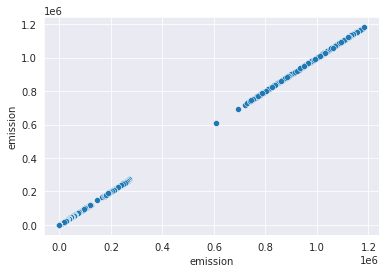

In [156]:
sns.scatterplot(data = train, x = 'emission', y = 'emission');

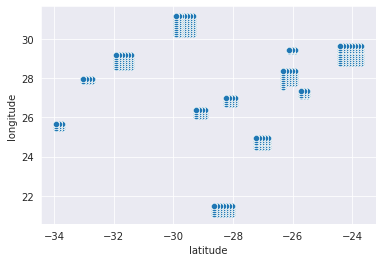

In [157]:
sns.scatterplot(data = train, x = 'latitude', y = 'longitude');

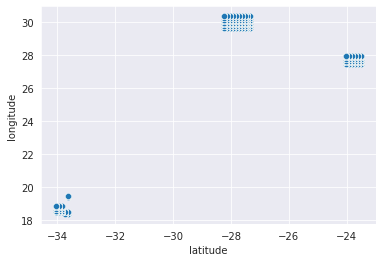

In [158]:
sns.scatterplot(data = test, x = 'latitude', y = 'longitude');

In [159]:
test.shape[0] == (test_x.shape[0] + test_y.shape[0] + test_z.shape[0])

False

In [160]:
train_x = train[train['latitude'] > -25]
test_x = test[test['latitude'] > -25]
test_x.shape
train_y = train[train['latitude'] > -29]
train_y = train_y[train_y['latitude'] < -27]
# train_y = train_y[train_y['longitude'] > 29]
test_y = test[test['longitude'] > 29]
test_y.shape
train_z = train[train['latitude'] < -33]
test_z = test[test['latitude'] < -33]
test_z.shape
X = train_x.drop(['ID_LAT_LON_YEAR_WEEK','emission'], axis = 1).fillna(0)
y = train_x.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

# model = LGBMRegressor()
model = CatBoostRegressor()
model.fit(X_train, y_train)

    # Local score
X = test_x.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
pred_x= model.predict(X)

X = train_y.drop(['ID_LAT_LON_YEAR_WEEK','emission'], axis = 1).fillna(0)
y = train_y.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

# model = LGBMRegressor()
model = CatBoostRegressor()
model.fit(X_train, y_train)

    # Local score
X = test_y.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
pred_y= model.predict(X)


X = train_z.drop(['ID_LAT_LON_YEAR_WEEK','emission'], axis = 1).fillna(0)
y = train_z.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

# model = LGBMRegressor()
model = CatBoostRegressor()
model.fit(X_train, y_train)

    # Local score
X = test_z.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
pred_z= model.predict(X)

submission_x = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test_x['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred_x
})
submission_y = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test_y['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred_y
})
submission_z = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test_z['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred_z
})
frames = [submission_x, submission_y, submission_z]
submission = pd.concat(frames)

predictions_in_order = []
for i in test['ID_LAT_LON_YEAR_WEEK']:
    prediction_for_id = submission.emission[submission["ID_LAT_LON_YEAR_WEEK"] == i]
    predictions_in_order.append(prediction_for_id)

pred = []
for i in predictions_in_order:
    for j in i.values:
        pred.append(j)
pred

submissions = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred
})

Learning rate set to 0.063687
0:	learn: 1887.9497371	total: 15.7ms	remaining: 15.6s
1:	learn: 1820.3534701	total: 31ms	remaining: 15.5s
2:	learn: 1771.2304544	total: 46.5ms	remaining: 15.4s
3:	learn: 1714.1258777	total: 61ms	remaining: 15.2s
4:	learn: 1662.3532803	total: 77.9ms	remaining: 15.5s
5:	learn: 1615.5130755	total: 94ms	remaining: 15.6s
6:	learn: 1573.2230917	total: 109ms	remaining: 15.5s
7:	learn: 1535.1188365	total: 125ms	remaining: 15.5s
8:	learn: 1500.2415405	total: 140ms	remaining: 15.4s
9:	learn: 1466.3119381	total: 156ms	remaining: 15.4s
10:	learn: 1437.2075963	total: 172ms	remaining: 15.5s
11:	learn: 1383.0469208	total: 187ms	remaining: 15.4s
12:	learn: 1339.5725960	total: 206ms	remaining: 15.6s
13:	learn: 1294.1232672	total: 225ms	remaining: 15.8s
14:	learn: 1269.6197135	total: 245ms	remaining: 16.1s
15:	learn: 1228.3584122	total: 263ms	remaining: 16.2s
16:	learn: 1204.9577151	total: 280ms	remaining: 16.2s
17:	learn: 1168.3601557	total: 296ms	remaining: 16.1s
18:	lear

154:	learn: 352.1986827	total: 2.74s	remaining: 14.9s
155:	learn: 350.0663521	total: 2.76s	remaining: 14.9s
156:	learn: 347.3920148	total: 2.77s	remaining: 14.9s
157:	learn: 346.5713021	total: 2.79s	remaining: 14.9s
158:	learn: 342.7472222	total: 2.81s	remaining: 14.9s
159:	learn: 340.2632850	total: 2.83s	remaining: 14.9s
160:	learn: 339.4476076	total: 2.85s	remaining: 14.8s
161:	learn: 339.2349646	total: 2.86s	remaining: 14.8s
162:	learn: 337.2972926	total: 2.88s	remaining: 14.8s
163:	learn: 337.0699773	total: 2.9s	remaining: 14.8s
164:	learn: 336.8051562	total: 2.91s	remaining: 14.7s
165:	learn: 334.6002309	total: 2.93s	remaining: 14.7s
166:	learn: 333.2117415	total: 2.94s	remaining: 14.7s
167:	learn: 333.0143545	total: 2.96s	remaining: 14.7s
168:	learn: 332.1418587	total: 2.98s	remaining: 14.7s
169:	learn: 330.4124460	total: 3s	remaining: 14.6s
170:	learn: 328.3837715	total: 3.01s	remaining: 14.6s
171:	learn: 325.9151059	total: 3.03s	remaining: 14.6s
172:	learn: 324.0372912	total: 3

313:	learn: 232.8231577	total: 5.46s	remaining: 11.9s
314:	learn: 232.6864690	total: 5.47s	remaining: 11.9s
315:	learn: 231.9615510	total: 5.49s	remaining: 11.9s
316:	learn: 231.8253740	total: 5.51s	remaining: 11.9s
317:	learn: 231.7268151	total: 5.53s	remaining: 11.9s
318:	learn: 231.6189924	total: 5.55s	remaining: 11.9s
319:	learn: 231.5548659	total: 5.57s	remaining: 11.8s
320:	learn: 231.4037897	total: 5.59s	remaining: 11.8s
321:	learn: 230.2496770	total: 5.6s	remaining: 11.8s
322:	learn: 230.0728325	total: 5.62s	remaining: 11.8s
323:	learn: 229.3859670	total: 5.63s	remaining: 11.8s
324:	learn: 228.7167356	total: 5.65s	remaining: 11.7s
325:	learn: 227.9307879	total: 5.67s	remaining: 11.7s
326:	learn: 227.2229728	total: 5.69s	remaining: 11.7s
327:	learn: 227.1524277	total: 5.71s	remaining: 11.7s
328:	learn: 227.0652437	total: 5.72s	remaining: 11.7s
329:	learn: 226.8374665	total: 5.74s	remaining: 11.7s
330:	learn: 226.3861689	total: 5.75s	remaining: 11.6s
331:	learn: 226.3009989	total

475:	learn: 185.7293958	total: 8.19s	remaining: 9.01s
476:	learn: 185.6638146	total: 8.21s	remaining: 9s
477:	learn: 185.5602222	total: 8.22s	remaining: 8.98s
478:	learn: 185.4239308	total: 8.24s	remaining: 8.96s
479:	learn: 185.3663524	total: 8.26s	remaining: 8.94s
480:	learn: 185.2547034	total: 8.27s	remaining: 8.92s
481:	learn: 185.2300479	total: 8.29s	remaining: 8.9s
482:	learn: 185.1859297	total: 8.3s	remaining: 8.88s
483:	learn: 184.6876165	total: 8.32s	remaining: 8.87s
484:	learn: 184.6460532	total: 8.34s	remaining: 8.85s
485:	learn: 184.5412832	total: 8.36s	remaining: 8.84s
486:	learn: 183.9838091	total: 8.37s	remaining: 8.82s
487:	learn: 183.5576722	total: 8.39s	remaining: 8.8s
488:	learn: 183.5073751	total: 8.41s	remaining: 8.79s
489:	learn: 183.4265798	total: 8.43s	remaining: 8.78s
490:	learn: 183.4030665	total: 8.45s	remaining: 8.76s
491:	learn: 183.3149016	total: 8.46s	remaining: 8.74s
492:	learn: 183.2877823	total: 8.48s	remaining: 8.72s
493:	learn: 183.2436857	total: 8.4

636:	learn: 158.1482465	total: 10.9s	remaining: 6.21s
637:	learn: 157.8739547	total: 10.9s	remaining: 6.19s
638:	learn: 157.8497339	total: 10.9s	remaining: 6.18s
639:	learn: 157.7787596	total: 11s	remaining: 6.16s
640:	learn: 157.7399419	total: 11s	remaining: 6.14s
641:	learn: 157.7049774	total: 11s	remaining: 6.13s
642:	learn: 157.3167900	total: 11s	remaining: 6.11s
643:	learn: 157.2558008	total: 11s	remaining: 6.09s
644:	learn: 157.1812015	total: 11s	remaining: 6.07s
645:	learn: 157.1251057	total: 11s	remaining: 6.05s
646:	learn: 157.0854453	total: 11.1s	remaining: 6.04s
647:	learn: 157.0305352	total: 11.1s	remaining: 6.02s
648:	learn: 156.9515714	total: 11.1s	remaining: 6s
649:	learn: 156.8657979	total: 11.1s	remaining: 5.99s
650:	learn: 156.7608428	total: 11.1s	remaining: 5.97s
651:	learn: 156.7143138	total: 11.2s	remaining: 5.95s
652:	learn: 156.6197118	total: 11.2s	remaining: 5.93s
653:	learn: 156.5666667	total: 11.2s	remaining: 5.92s
654:	learn: 156.5108903	total: 11.2s	remainin

800:	learn: 143.1331234	total: 13.6s	remaining: 3.38s
801:	learn: 143.0869726	total: 13.6s	remaining: 3.36s
802:	learn: 143.0226203	total: 13.6s	remaining: 3.35s
803:	learn: 142.9579737	total: 13.7s	remaining: 3.33s
804:	learn: 142.9052192	total: 13.7s	remaining: 3.31s
805:	learn: 142.8534686	total: 13.7s	remaining: 3.29s
806:	learn: 142.7909337	total: 13.7s	remaining: 3.28s
807:	learn: 142.7543842	total: 13.7s	remaining: 3.26s
808:	learn: 142.7135575	total: 13.7s	remaining: 3.24s
809:	learn: 142.6842798	total: 13.7s	remaining: 3.22s
810:	learn: 142.6681228	total: 13.8s	remaining: 3.21s
811:	learn: 142.5946893	total: 13.8s	remaining: 3.19s
812:	learn: 142.5315749	total: 13.8s	remaining: 3.17s
813:	learn: 142.4662180	total: 13.8s	remaining: 3.15s
814:	learn: 142.3999761	total: 13.8s	remaining: 3.14s
815:	learn: 142.3599613	total: 13.8s	remaining: 3.12s
816:	learn: 142.2649597	total: 13.9s	remaining: 3.1s
817:	learn: 142.2204025	total: 13.9s	remaining: 3.09s
818:	learn: 142.1979361	total

957:	learn: 133.4406980	total: 16.1s	remaining: 707ms
958:	learn: 133.4038534	total: 16.1s	remaining: 690ms
959:	learn: 133.3720648	total: 16.2s	remaining: 673ms
960:	learn: 133.3544269	total: 16.2s	remaining: 656ms
961:	learn: 133.3088993	total: 16.2s	remaining: 640ms
962:	learn: 133.2749844	total: 16.2s	remaining: 623ms
963:	learn: 133.2346541	total: 16.2s	remaining: 606ms
964:	learn: 133.2075932	total: 16.2s	remaining: 589ms
965:	learn: 132.7995519	total: 16.3s	remaining: 572ms
966:	learn: 132.7607720	total: 16.3s	remaining: 555ms
967:	learn: 132.7067409	total: 16.3s	remaining: 538ms
968:	learn: 132.6716665	total: 16.3s	remaining: 522ms
969:	learn: 132.6462704	total: 16.3s	remaining: 505ms
970:	learn: 132.5942182	total: 16.3s	remaining: 488ms
971:	learn: 132.5546207	total: 16.4s	remaining: 471ms
972:	learn: 132.5086282	total: 16.4s	remaining: 454ms
973:	learn: 132.4826412	total: 16.4s	remaining: 437ms
974:	learn: 132.4375506	total: 16.4s	remaining: 421ms
975:	learn: 132.4152196	tota

111:	learn: 234.2656483	total: 1.83s	remaining: 14.5s
112:	learn: 232.4261089	total: 1.85s	remaining: 14.6s
113:	learn: 230.6676063	total: 1.88s	remaining: 14.6s
114:	learn: 228.9545725	total: 1.94s	remaining: 14.9s
115:	learn: 228.1433422	total: 1.95s	remaining: 14.9s
116:	learn: 226.9331160	total: 1.97s	remaining: 14.9s
117:	learn: 224.9811475	total: 1.99s	remaining: 14.9s
118:	learn: 223.9065380	total: 2s	remaining: 14.8s
119:	learn: 221.2042508	total: 2.02s	remaining: 14.8s
120:	learn: 220.1943350	total: 2.04s	remaining: 14.8s
121:	learn: 219.7070096	total: 2.05s	remaining: 14.8s
122:	learn: 218.2295396	total: 2.07s	remaining: 14.8s
123:	learn: 217.2765773	total: 2.09s	remaining: 14.8s
124:	learn: 215.6544802	total: 2.11s	remaining: 14.7s
125:	learn: 215.0468342	total: 2.12s	remaining: 14.7s
126:	learn: 214.5433060	total: 2.14s	remaining: 14.7s
127:	learn: 213.3394451	total: 2.15s	remaining: 14.7s
128:	learn: 213.0575905	total: 2.17s	remaining: 14.6s
129:	learn: 210.3490677	total: 

276:	learn: 137.2323254	total: 4.52s	remaining: 11.8s
277:	learn: 137.1743503	total: 4.54s	remaining: 11.8s
278:	learn: 137.1070618	total: 4.56s	remaining: 11.8s
279:	learn: 136.9222109	total: 4.58s	remaining: 11.8s
280:	learn: 136.6400513	total: 4.59s	remaining: 11.8s
281:	learn: 136.4966484	total: 4.61s	remaining: 11.7s
282:	learn: 136.3567420	total: 4.62s	remaining: 11.7s
283:	learn: 136.0258622	total: 4.64s	remaining: 11.7s
284:	learn: 135.9501072	total: 4.65s	remaining: 11.7s
285:	learn: 135.5162844	total: 4.67s	remaining: 11.7s
286:	learn: 135.4483612	total: 4.68s	remaining: 11.6s
287:	learn: 135.3372067	total: 4.7s	remaining: 11.6s
288:	learn: 134.8883069	total: 4.72s	remaining: 11.6s
289:	learn: 134.8017253	total: 4.73s	remaining: 11.6s
290:	learn: 134.7382190	total: 4.75s	remaining: 11.6s
291:	learn: 134.4681730	total: 4.77s	remaining: 11.6s
292:	learn: 134.3929251	total: 4.78s	remaining: 11.5s
293:	learn: 134.3407963	total: 4.8s	remaining: 11.5s
294:	learn: 133.7512346	total:

432:	learn: 113.9119629	total: 6.99s	remaining: 9.16s
433:	learn: 113.8104531	total: 7.01s	remaining: 9.14s
434:	learn: 113.7879274	total: 7.03s	remaining: 9.13s
435:	learn: 113.6992383	total: 7.05s	remaining: 9.11s
436:	learn: 113.6345978	total: 7.06s	remaining: 9.1s
437:	learn: 113.6055849	total: 7.08s	remaining: 9.08s
438:	learn: 113.5875834	total: 7.09s	remaining: 9.06s
439:	learn: 113.5278751	total: 7.11s	remaining: 9.04s
440:	learn: 113.5019252	total: 7.12s	remaining: 9.02s
441:	learn: 113.4670337	total: 7.13s	remaining: 9.01s
442:	learn: 113.4441675	total: 7.15s	remaining: 8.99s
443:	learn: 113.4230062	total: 7.16s	remaining: 8.97s
444:	learn: 113.3624095	total: 7.18s	remaining: 8.95s
445:	learn: 113.3197678	total: 7.19s	remaining: 8.94s
446:	learn: 113.2628322	total: 7.21s	remaining: 8.92s
447:	learn: 113.2150988	total: 7.23s	remaining: 8.91s
448:	learn: 113.0036776	total: 7.25s	remaining: 8.89s
449:	learn: 112.9663625	total: 7.26s	remaining: 8.87s
450:	learn: 112.8775740	total

587:	learn: 101.2889797	total: 9.46s	remaining: 6.63s
588:	learn: 101.1629570	total: 9.48s	remaining: 6.62s
589:	learn: 101.0839304	total: 9.5s	remaining: 6.6s
590:	learn: 101.0618441	total: 9.52s	remaining: 6.59s
591:	learn: 101.0267546	total: 9.53s	remaining: 6.57s
592:	learn: 100.9751289	total: 9.55s	remaining: 6.55s
593:	learn: 100.9142615	total: 9.56s	remaining: 6.54s
594:	learn: 100.7784608	total: 9.58s	remaining: 6.52s
595:	learn: 100.7136317	total: 9.6s	remaining: 6.5s
596:	learn: 100.6839224	total: 9.61s	remaining: 6.49s
597:	learn: 100.6435871	total: 9.63s	remaining: 6.47s
598:	learn: 100.5795423	total: 9.64s	remaining: 6.45s
599:	learn: 100.5590553	total: 9.65s	remaining: 6.44s
600:	learn: 100.5262763	total: 9.67s	remaining: 6.42s
601:	learn: 100.4622945	total: 9.69s	remaining: 6.41s
602:	learn: 100.4417948	total: 9.71s	remaining: 6.39s
603:	learn: 100.3454265	total: 9.72s	remaining: 6.37s
604:	learn: 100.3214186	total: 9.74s	remaining: 6.36s
605:	learn: 100.2893872	total: 9

743:	learn: 90.5384583	total: 11.9s	remaining: 4.11s
744:	learn: 90.5115663	total: 12s	remaining: 4.09s
745:	learn: 90.4823546	total: 12s	remaining: 4.08s
746:	learn: 90.3278912	total: 12s	remaining: 4.06s
747:	learn: 90.3010259	total: 12s	remaining: 4.05s
748:	learn: 90.2249657	total: 12s	remaining: 4.03s
749:	learn: 90.1940141	total: 12s	remaining: 4.01s
750:	learn: 90.1564182	total: 12.1s	remaining: 4s
751:	learn: 90.1353939	total: 12.1s	remaining: 3.98s
752:	learn: 90.0496484	total: 12.1s	remaining: 3.96s
753:	learn: 90.0300440	total: 12.1s	remaining: 3.95s
754:	learn: 90.0141401	total: 12.1s	remaining: 3.93s
755:	learn: 89.9865010	total: 12.1s	remaining: 3.92s
756:	learn: 89.9565324	total: 12.1s	remaining: 3.9s
757:	learn: 89.8644899	total: 12.2s	remaining: 3.88s
758:	learn: 89.7824935	total: 12.2s	remaining: 3.87s
759:	learn: 89.7449769	total: 12.2s	remaining: 3.85s
760:	learn: 89.7068614	total: 12.2s	remaining: 3.84s
761:	learn: 89.6301641	total: 12.2s	remaining: 3.82s
762:	lear

899:	learn: 82.7679041	total: 14.4s	remaining: 1.6s
900:	learn: 82.7524638	total: 14.4s	remaining: 1.58s
901:	learn: 82.6053595	total: 14.4s	remaining: 1.57s
902:	learn: 82.5654020	total: 14.5s	remaining: 1.55s
903:	learn: 82.5370094	total: 14.5s	remaining: 1.54s
904:	learn: 82.4419200	total: 14.5s	remaining: 1.52s
905:	learn: 82.4178753	total: 14.5s	remaining: 1.5s
906:	learn: 82.3988033	total: 14.5s	remaining: 1.49s
907:	learn: 82.3281516	total: 14.5s	remaining: 1.47s
908:	learn: 82.3162783	total: 14.6s	remaining: 1.46s
909:	learn: 82.2973179	total: 14.6s	remaining: 1.44s
910:	learn: 82.2548657	total: 14.6s	remaining: 1.42s
911:	learn: 82.2318982	total: 14.6s	remaining: 1.41s
912:	learn: 82.2097400	total: 14.6s	remaining: 1.39s
913:	learn: 82.1797395	total: 14.6s	remaining: 1.38s
914:	learn: 82.1413114	total: 14.7s	remaining: 1.36s
915:	learn: 82.1038833	total: 14.7s	remaining: 1.34s
916:	learn: 82.0623979	total: 14.7s	remaining: 1.33s
917:	learn: 82.0389689	total: 14.7s	remaining: 1

62:	learn: 1648.5889663	total: 836ms	remaining: 12.4s
63:	learn: 1620.6638176	total: 853ms	remaining: 12.5s
64:	learn: 1592.4598954	total: 871ms	remaining: 12.5s
65:	learn: 1563.3831719	total: 884ms	remaining: 12.5s
66:	learn: 1542.2567928	total: 897ms	remaining: 12.5s
67:	learn: 1521.0430634	total: 911ms	remaining: 12.5s
68:	learn: 1504.8230308	total: 924ms	remaining: 12.5s
69:	learn: 1482.5805669	total: 937ms	remaining: 12.4s
70:	learn: 1468.6576000	total: 950ms	remaining: 12.4s
71:	learn: 1450.3543342	total: 962ms	remaining: 12.4s
72:	learn: 1436.0021215	total: 975ms	remaining: 12.4s
73:	learn: 1418.7184336	total: 988ms	remaining: 12.4s
74:	learn: 1405.2640506	total: 1s	remaining: 12.3s
75:	learn: 1382.1260198	total: 1.01s	remaining: 12.3s
76:	learn: 1369.9637971	total: 1.03s	remaining: 12.3s
77:	learn: 1352.7568333	total: 1.04s	remaining: 12.3s
78:	learn: 1339.4512465	total: 1.06s	remaining: 12.3s
79:	learn: 1328.4511447	total: 1.07s	remaining: 12.3s
80:	learn: 1307.7809347	total: 

217:	learn: 766.5519375	total: 2.9s	remaining: 10.4s
218:	learn: 764.5787327	total: 2.91s	remaining: 10.4s
219:	learn: 763.1715834	total: 2.93s	remaining: 10.4s
220:	learn: 761.2001725	total: 2.94s	remaining: 10.4s
221:	learn: 760.2309294	total: 2.96s	remaining: 10.4s
222:	learn: 756.9368955	total: 2.97s	remaining: 10.3s
223:	learn: 755.6866012	total: 2.98s	remaining: 10.3s
224:	learn: 754.7962550	total: 2.99s	remaining: 10.3s
225:	learn: 752.8659314	total: 3.01s	remaining: 10.3s
226:	learn: 752.2373919	total: 3.02s	remaining: 10.3s
227:	learn: 751.1925298	total: 3.03s	remaining: 10.3s
228:	learn: 749.7380581	total: 3.04s	remaining: 10.3s
229:	learn: 743.1539493	total: 3.06s	remaining: 10.2s
230:	learn: 740.8217655	total: 3.07s	remaining: 10.2s
231:	learn: 740.1023261	total: 3.08s	remaining: 10.2s
232:	learn: 739.6999993	total: 3.1s	remaining: 10.2s
233:	learn: 738.6082531	total: 3.11s	remaining: 10.2s
234:	learn: 736.2447725	total: 3.13s	remaining: 10.2s
235:	learn: 735.1865567	total:

375:	learn: 557.1970972	total: 5s	remaining: 8.29s
376:	learn: 556.9812803	total: 5.01s	remaining: 8.28s
377:	learn: 556.3450307	total: 5.03s	remaining: 8.28s
378:	learn: 554.9307429	total: 5.04s	remaining: 8.26s
379:	learn: 554.5497108	total: 5.05s	remaining: 8.25s
380:	learn: 553.2504851	total: 5.07s	remaining: 8.23s
381:	learn: 552.9666780	total: 5.08s	remaining: 8.22s
382:	learn: 552.0345988	total: 5.09s	remaining: 8.21s
383:	learn: 551.4801929	total: 5.11s	remaining: 8.19s
384:	learn: 550.5214078	total: 5.12s	remaining: 8.18s
385:	learn: 550.3284826	total: 5.13s	remaining: 8.16s
386:	learn: 550.1418855	total: 5.14s	remaining: 8.15s
387:	learn: 548.3860277	total: 5.16s	remaining: 8.13s
388:	learn: 546.2411127	total: 5.17s	remaining: 8.12s
389:	learn: 545.4407199	total: 5.18s	remaining: 8.11s
390:	learn: 544.7065695	total: 5.19s	remaining: 8.09s
391:	learn: 544.0885945	total: 5.21s	remaining: 8.08s
392:	learn: 543.2559273	total: 5.22s	remaining: 8.07s
393:	learn: 542.8098868	total: 

531:	learn: 445.5793106	total: 7.07s	remaining: 6.22s
532:	learn: 444.8719063	total: 7.09s	remaining: 6.21s
533:	learn: 444.0683234	total: 7.12s	remaining: 6.21s
534:	learn: 443.5429313	total: 7.15s	remaining: 6.22s
535:	learn: 443.0363584	total: 7.17s	remaining: 6.21s
536:	learn: 442.4452802	total: 7.19s	remaining: 6.2s
537:	learn: 441.9235958	total: 7.21s	remaining: 6.19s
538:	learn: 441.4845453	total: 7.22s	remaining: 6.17s
539:	learn: 441.1468434	total: 7.23s	remaining: 6.16s
540:	learn: 440.7337401	total: 7.24s	remaining: 6.15s
541:	learn: 440.4934445	total: 7.26s	remaining: 6.13s
542:	learn: 440.0142545	total: 7.27s	remaining: 6.12s
543:	learn: 439.5576958	total: 7.28s	remaining: 6.1s
544:	learn: 439.1367580	total: 7.3s	remaining: 6.09s
545:	learn: 438.5301130	total: 7.31s	remaining: 6.08s
546:	learn: 437.7267776	total: 7.32s	remaining: 6.07s
547:	learn: 437.3984070	total: 7.34s	remaining: 6.05s
548:	learn: 437.1223737	total: 7.35s	remaining: 6.04s
549:	learn: 436.9356049	total: 

698:	learn: 361.7957618	total: 9.34s	remaining: 4.02s
699:	learn: 361.4316951	total: 9.36s	remaining: 4.01s
700:	learn: 360.7255619	total: 9.37s	remaining: 4s
701:	learn: 360.2422673	total: 9.39s	remaining: 3.98s
702:	learn: 359.6042390	total: 9.4s	remaining: 3.97s
703:	learn: 359.1019374	total: 9.41s	remaining: 3.96s
704:	learn: 358.7230503	total: 9.43s	remaining: 3.94s
705:	learn: 358.3097021	total: 9.44s	remaining: 3.93s
706:	learn: 357.8140984	total: 9.45s	remaining: 3.92s
707:	learn: 357.3584298	total: 9.46s	remaining: 3.9s
708:	learn: 357.0629333	total: 9.48s	remaining: 3.89s
709:	learn: 356.6403546	total: 9.49s	remaining: 3.88s
710:	learn: 356.3718005	total: 9.5s	remaining: 3.86s
711:	learn: 355.6692778	total: 9.52s	remaining: 3.85s
712:	learn: 355.3303311	total: 9.53s	remaining: 3.83s
713:	learn: 354.8751774	total: 9.54s	remaining: 3.82s
714:	learn: 354.6560256	total: 9.56s	remaining: 3.81s
715:	learn: 354.2955133	total: 9.57s	remaining: 3.8s
716:	learn: 353.8636998	total: 9.59

864:	learn: 297.4491279	total: 11.6s	remaining: 1.8s
865:	learn: 297.3229122	total: 11.6s	remaining: 1.79s
866:	learn: 297.0360473	total: 11.6s	remaining: 1.78s
867:	learn: 296.6667262	total: 11.6s	remaining: 1.76s
868:	learn: 296.3197673	total: 11.6s	remaining: 1.75s
869:	learn: 295.9744988	total: 11.6s	remaining: 1.74s
870:	learn: 295.8310859	total: 11.6s	remaining: 1.72s
871:	learn: 295.4205160	total: 11.7s	remaining: 1.71s
872:	learn: 294.6902464	total: 11.7s	remaining: 1.7s
873:	learn: 294.3800493	total: 11.7s	remaining: 1.68s
874:	learn: 293.9948906	total: 11.7s	remaining: 1.67s
875:	learn: 293.7541294	total: 11.7s	remaining: 1.66s
876:	learn: 293.3988288	total: 11.7s	remaining: 1.64s
877:	learn: 293.1586205	total: 11.7s	remaining: 1.63s
878:	learn: 292.8836591	total: 11.7s	remaining: 1.62s
879:	learn: 292.6613717	total: 11.8s	remaining: 1.6s
880:	learn: 292.2821703	total: 11.8s	remaining: 1.59s
881:	learn: 291.9429358	total: 11.8s	remaining: 1.58s
882:	learn: 291.6586396	total: 

In [161]:
test.shape[0] == pred_x.shape[0] + pred_y.shape[0] + pred_z.shape[0]

True

In [162]:
submissions.to_csv('submission_4.csv', index = False)

## Idea 4

In [163]:
test['week_no'].value_counts().index == train['week_no'].value_counts().index

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True])

In [164]:
# train = train.drop(['outliers'], axis = 1).fillna(0)
predictions = []
for i in train['week_no'].value_counts().index:
    trainx = train[train['week_no'] == i]
    X = trainx.drop(['ID_LAT_LON_YEAR_WEEK','emission'], axis = 1).fillna(0)
    y = trainx.emission
    

# Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

#     model = LGBMRegressor()
    model = CatBoostRegressor()
    model.fit(X_train, y_train)
    
    testx = test[test['week_no'] == i]
    X = testx.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
    # Local score
    y_pred = model.predict(X)

    predictions.append(y_pred)

Learning rate set to 0.043381
0:	learn: 39139.0795989	total: 126ms	remaining: 2m 6s
1:	learn: 38751.3136074	total: 154ms	remaining: 1m 16s
2:	learn: 38129.3949721	total: 173ms	remaining: 57.6s
3:	learn: 37533.1892426	total: 189ms	remaining: 47.2s
4:	learn: 36948.5297307	total: 206ms	remaining: 41s
5:	learn: 36366.8211943	total: 219ms	remaining: 36.3s
6:	learn: 35803.2351924	total: 232ms	remaining: 32.9s
7:	learn: 35251.4181613	total: 246ms	remaining: 30.5s
8:	learn: 34909.3624235	total: 262ms	remaining: 28.9s
9:	learn: 34130.8913226	total: 276ms	remaining: 27.4s
10:	learn: 33390.8466860	total: 288ms	remaining: 25.9s
11:	learn: 32882.4479837	total: 300ms	remaining: 24.7s
12:	learn: 32388.0938293	total: 311ms	remaining: 23.6s
13:	learn: 31901.8952859	total: 323ms	remaining: 22.8s
14:	learn: 31219.4941903	total: 334ms	remaining: 22s
15:	learn: 30755.6194942	total: 346ms	remaining: 21.3s
16:	learn: 30109.7102366	total: 358ms	remaining: 20.7s
17:	learn: 29668.3153723	total: 369ms	remaining:

150:	learn: 9122.7627896	total: 2.01s	remaining: 11.3s
151:	learn: 9088.2768005	total: 2.02s	remaining: 11.3s
152:	learn: 9046.3367715	total: 2.04s	remaining: 11.3s
153:	learn: 9008.1943577	total: 2.05s	remaining: 11.3s
154:	learn: 8982.4958465	total: 2.06s	remaining: 11.3s
155:	learn: 8959.5373610	total: 2.08s	remaining: 11.2s
156:	learn: 8901.8526337	total: 2.09s	remaining: 11.2s
157:	learn: 8852.9642642	total: 2.1s	remaining: 11.2s
158:	learn: 8817.3028848	total: 2.11s	remaining: 11.2s
159:	learn: 8774.4160704	total: 2.12s	remaining: 11.1s
160:	learn: 8760.4102049	total: 2.13s	remaining: 11.1s
161:	learn: 8712.7794356	total: 2.15s	remaining: 11.1s
162:	learn: 8678.1824249	total: 2.16s	remaining: 11.1s
163:	learn: 8642.2149501	total: 2.17s	remaining: 11.1s
164:	learn: 8576.5661052	total: 2.18s	remaining: 11s
165:	learn: 8537.6086187	total: 2.19s	remaining: 11s
166:	learn: 8507.8719561	total: 2.2s	remaining: 11s
167:	learn: 8489.1508998	total: 2.22s	remaining: 11s
168:	learn: 8450.133

300:	learn: 5214.8248060	total: 3.85s	remaining: 8.95s
301:	learn: 5201.0991691	total: 3.87s	remaining: 8.94s
302:	learn: 5189.4788723	total: 3.88s	remaining: 8.93s
303:	learn: 5175.8827241	total: 3.9s	remaining: 8.92s
304:	learn: 5167.5988125	total: 3.91s	remaining: 8.91s
305:	learn: 5150.9919201	total: 3.92s	remaining: 8.9s
306:	learn: 5144.8348298	total: 3.94s	remaining: 8.88s
307:	learn: 5140.1877430	total: 3.95s	remaining: 8.87s
308:	learn: 5126.7071795	total: 3.96s	remaining: 8.86s
309:	learn: 5113.7275401	total: 3.97s	remaining: 8.84s
310:	learn: 5085.2404651	total: 3.98s	remaining: 8.83s
311:	learn: 5077.9143523	total: 4s	remaining: 8.81s
312:	learn: 5066.3498405	total: 4.01s	remaining: 8.8s
313:	learn: 5061.3485862	total: 4.02s	remaining: 8.79s
314:	learn: 5056.9209058	total: 4.03s	remaining: 8.77s
315:	learn: 5048.7354987	total: 4.05s	remaining: 8.76s
316:	learn: 5038.4873880	total: 4.06s	remaining: 8.75s
317:	learn: 5034.5183193	total: 4.07s	remaining: 8.74s
318:	learn: 5026

460:	learn: 3528.7996903	total: 5.95s	remaining: 6.95s
461:	learn: 3519.1989834	total: 5.96s	remaining: 6.94s
462:	learn: 3513.6901648	total: 5.97s	remaining: 6.93s
463:	learn: 3512.4812695	total: 5.99s	remaining: 6.92s
464:	learn: 3508.3497129	total: 6s	remaining: 6.91s
465:	learn: 3507.2285878	total: 6.01s	remaining: 6.89s
466:	learn: 3498.6744668	total: 6.03s	remaining: 6.88s
467:	learn: 3492.6817435	total: 6.04s	remaining: 6.86s
468:	learn: 3483.0556110	total: 6.05s	remaining: 6.85s
469:	learn: 3465.8972280	total: 6.06s	remaining: 6.84s
470:	learn: 3460.5049005	total: 6.08s	remaining: 6.83s
471:	learn: 3450.9233660	total: 6.09s	remaining: 6.81s
472:	learn: 3441.1356096	total: 6.1s	remaining: 6.8s
473:	learn: 3433.9022669	total: 6.11s	remaining: 6.78s
474:	learn: 3428.9652050	total: 6.13s	remaining: 6.77s
475:	learn: 3423.9559794	total: 6.14s	remaining: 6.76s
476:	learn: 3414.8134260	total: 6.15s	remaining: 6.74s
477:	learn: 3406.2494788	total: 6.17s	remaining: 6.73s
478:	learn: 338

620:	learn: 2652.0341826	total: 8.01s	remaining: 4.89s
621:	learn: 2646.9954078	total: 8.03s	remaining: 4.88s
622:	learn: 2645.4068974	total: 8.04s	remaining: 4.87s
623:	learn: 2644.4691723	total: 8.05s	remaining: 4.85s
624:	learn: 2635.2411209	total: 8.07s	remaining: 4.84s
625:	learn: 2633.2269652	total: 8.08s	remaining: 4.83s
626:	learn: 2630.7292998	total: 8.09s	remaining: 4.81s
627:	learn: 2624.0974167	total: 8.1s	remaining: 4.8s
628:	learn: 2623.1248690	total: 8.12s	remaining: 4.79s
629:	learn: 2619.1268294	total: 8.13s	remaining: 4.77s
630:	learn: 2613.9885886	total: 8.14s	remaining: 4.76s
631:	learn: 2610.8038625	total: 8.15s	remaining: 4.75s
632:	learn: 2607.1247429	total: 8.17s	remaining: 4.73s
633:	learn: 2600.4906475	total: 8.18s	remaining: 4.72s
634:	learn: 2596.4439198	total: 8.19s	remaining: 4.71s
635:	learn: 2593.8173962	total: 8.2s	remaining: 4.7s
636:	learn: 2593.1654644	total: 8.22s	remaining: 4.68s
637:	learn: 2588.3323754	total: 8.23s	remaining: 4.67s
638:	learn: 25

780:	learn: 2115.1612811	total: 10.1s	remaining: 2.83s
781:	learn: 2110.7180384	total: 10.1s	remaining: 2.81s
782:	learn: 2105.4794046	total: 10.1s	remaining: 2.8s
783:	learn: 2101.7794379	total: 10.1s	remaining: 2.79s
784:	learn: 2098.6921985	total: 10.1s	remaining: 2.77s
785:	learn: 2097.1809105	total: 10.1s	remaining: 2.76s
786:	learn: 2093.3912659	total: 10.2s	remaining: 2.75s
787:	learn: 2090.7120572	total: 10.2s	remaining: 2.74s
788:	learn: 2088.9553945	total: 10.2s	remaining: 2.72s
789:	learn: 2085.1474870	total: 10.2s	remaining: 2.71s
790:	learn: 2082.4271333	total: 10.2s	remaining: 2.7s
791:	learn: 2079.9614407	total: 10.2s	remaining: 2.68s
792:	learn: 2073.9553389	total: 10.2s	remaining: 2.67s
793:	learn: 2070.2687012	total: 10.2s	remaining: 2.66s
794:	learn: 2068.0125886	total: 10.3s	remaining: 2.65s
795:	learn: 2065.4423561	total: 10.3s	remaining: 2.63s
796:	learn: 2062.6480677	total: 10.3s	remaining: 2.62s
797:	learn: 2059.7815080	total: 10.3s	remaining: 2.61s
798:	learn: 

940:	learn: 1690.0076157	total: 12.1s	remaining: 762ms
941:	learn: 1687.7646000	total: 12.2s	remaining: 749ms
942:	learn: 1683.9021903	total: 12.2s	remaining: 736ms
943:	learn: 1680.6220790	total: 12.2s	remaining: 723ms
944:	learn: 1678.3335200	total: 12.2s	remaining: 711ms
945:	learn: 1675.8648971	total: 12.2s	remaining: 698ms
946:	learn: 1674.2653505	total: 12.2s	remaining: 685ms
947:	learn: 1669.9582745	total: 12.2s	remaining: 672ms
948:	learn: 1667.9514007	total: 12.3s	remaining: 659ms
949:	learn: 1664.8661373	total: 12.3s	remaining: 646ms
950:	learn: 1661.6866512	total: 12.3s	remaining: 633ms
951:	learn: 1661.0894950	total: 12.3s	remaining: 620ms
952:	learn: 1660.7192173	total: 12.3s	remaining: 607ms
953:	learn: 1658.0558870	total: 12.3s	remaining: 594ms
954:	learn: 1656.6949816	total: 12.3s	remaining: 581ms
955:	learn: 1655.3000586	total: 12.3s	remaining: 568ms
956:	learn: 1654.4202585	total: 12.4s	remaining: 555ms
957:	learn: 1653.1625602	total: 12.4s	remaining: 543ms
958:	learn

CatBoostError: catboost/libs/data/model_dataset_compatibility.cpp:72: Feature outliers is present in model but not in pool.

In [165]:
pred = []
for i in predictions:
    for j in i:
        pred.append(j)
pred

[]

In [166]:
trainx = train[train['week_no'] == 1]
len(trainx['ID_LAT_LON_YEAR_WEEK'].values)

1444

In [167]:
place_id = []
for i in test['week_no'].value_counts().index:
    testx = test[test['week_no'] == i]
    id = testx['ID_LAT_LON_YEAR_WEEK'].values
    place_id.append(id)
id = []
for i in place_id:
    for j in i:
        id.append(j)

submission_6 = pd.DataFrame({
    'ID_LAT_LON_YEAR_WEEK': id,
    'emission': pred
})

ValueError: All arrays must be of the same length

In [168]:
submission_6.to_csv('submission_6.csv', index = False)

NameError: name 'submission_6' is not defined

In [169]:
submission.emission[submission["ID_LAT_LON_YEAR_WEEK"] == 'ID_-23.53_27.47_2020_18']

69   57.86962
Name: emission, dtype: float64

In [170]:
train['outliers'] = train['emission'].apply(lambda x:0 if x < 400000 else 1)

In [171]:
train['outliers'].value_counts()

0    73800
1      205
Name: outliers, dtype: int64

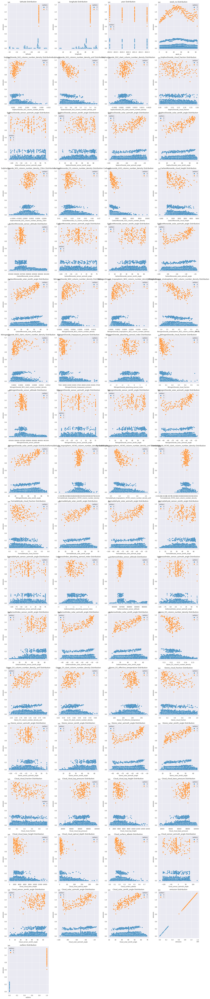

In [62]:
draw_scatter(train, 'emission','outliers', 18,4 )

In [172]:
train.latitude[train['emission'] > 400000].value_counts()
# test.latitude[test['emission'] > 400000].value_counts()

-25.93000    205
Name: latitude, dtype: int64

In [173]:
train.longitude[train['emission'] > 400000].value_counts()
# train.longitude[train['emission'] > 400000].value_counts()

29.37000    205
Name: longitude, dtype: int64

In [174]:
train_outliers =  train[train['latitude'] == -25.9300]
train_outliers = train_outliers[train_outliers['longitude'] == 29.37000]
train_outliers

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,outliers
20295,ID_-25.93_29.37_2019_1,-25.93000,29.37000,2019,1,0.00026,0.51587,0.00009,0.10569,4.48763,...,65556.26571,2921.53568,11.89910,0.29562,46.40292,54.67522,-80.70452,16.67307,742538.50000,1
20296,ID_-25.93_29.37_2019_2,-25.93000,29.37000,2019,2,0.00076,0.68719,0.00046,0.11593,4.60813,...,82280.98571,1574.60327,7.35093,0.23980,-13.27049,38.04863,-86.58376,25.64605,792294.30000,1
20297,ID_-25.93_29.37_2019_3,-25.93000,29.37000,2019,3,0.00068,0.76835,0.00052,0.20084,-43.38074,...,66969.57142,2909.11132,7.42325,0.23931,76.08233,41.21437,-76.72019,17.07458,833601.25000,1
20298,ID_-25.93_29.37_2019_4,-25.93000,29.37000,2019,4,0.00149,0.51412,0.00076,0.04591,-8.92033,...,83727.05793,1572.02785,5.59449,0.22673,31.47413,32.72775,-71.97329,20.07786,838745.40000,1
20299,ID_-25.93_29.37_2019_5,-25.93000,29.37000,2019,5,0.00029,0.90897,0.00024,0.21786,-13.26745,...,52371.49192,4466.36639,31.95428,0.25130,-31.47132,51.56370,-74.57770,26.93763,851521.50000,1
20300,ID_-25.93_29.37_2019_6,-25.93000,29.37000,2019,6,0.00100,0.56251,0.00056,0.05182,56.71130,...,80049.20025,1587.01884,14.69560,0.31065,-8.39939,61.45072,-63.16342,24.83311,904321.70000,1
20301,ID_-25.93_29.37_2019_7,-25.93000,29.37000,2019,7,-0.00060,0.40936,-0.00025,0.00000,75.97566,...,52702.67188,4432.25973,32.90021,0.24693,-0.68930,37.06437,-60.69582,24.14028,890322.94000,1
20302,ID_-25.93_29.37_2019_8,-25.93000,29.37000,2019,8,-0.00020,0.45855,-0.00009,0.06409,-15.04855,...,83750.37544,1569.69789,5.58717,0.25785,-14.36993,62.83943,-53.91261,28.69265,889023.00000,1
20303,ID_-25.93_29.37_2019_9,-25.93000,29.37000,2019,9,0.00011,0.54274,0.00006,0.08419,4.60365,...,80460.35285,1601.86733,7.19927,0.24135,-43.21856,31.00721,-55.85270,29.99813,1030983.75000,1
20304,ID_-25.93_29.37_2019_10,-25.93000,29.37000,2019,10,0.00045,0.90942,0.00043,0.22020,-51.89062,...,78453.24783,1811.04523,8.81973,0.28580,-43.37606,44.56194,-56.39089,34.11709,1038997.06000,1


In [175]:
test[test['longitude'] == 29.37000]

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_pressure,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle


In [176]:
train_inliers = train.drop(train_outliers.index, axis = 0)
train_inliers.shape

(73800, 70)

In [177]:
X = train.drop(['ID_LAT_LON_YEAR_WEEK','emission'], axis = 1).fillna(0)
y = train.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = SEED)

model = LGBMRegressor()
model.fit(X_train, y_train)

X = train_outliers.drop(['ID_LAT_LON_YEAR_WEEK','emission'], axis = 1).fillna(0)
y = train_outliers.emission

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.99, random_state = SEED)

    # Local score
y_pred = model.predict(X_test)
score = mean_squared_error(y_test, y_pred, squared=False)
    
print('Local RMSE:', score)

Local RMSE: 26403.146874525966


In [178]:
X = train_x.drop(['ID_LAT_LON_YEAR_WEEK','emission'], axis = 1).fillna(0)
y = train_x.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = SEED)

model = LGBMRegressor()
model.fit(X_train, y_train)

    # Local score
y_pred = model.predict(X_test)
score = mean_squared_error(y_test, y_pred, squared=False)
    
print('Local RMSE:', score)

Local RMSE: 157.46134330819956


In [179]:
X = train_outliers.drop(['ID_LAT_LON_YEAR_WEEK','emission'], axis = 1).fillna(0)
y = train_outliers.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = SEED)

model = LGBMRegressor()
model.fit(X_train, y_train)

    # Local score
y_pred = model.predict(X_test)
score = mean_squared_error(y_test, y_pred, squared=False)
    
print('Local RMSE:', score)

Local RMSE: 59098.74571420639


## Idea 6

In [ ]:
draw_hist(train,test, 18,4)

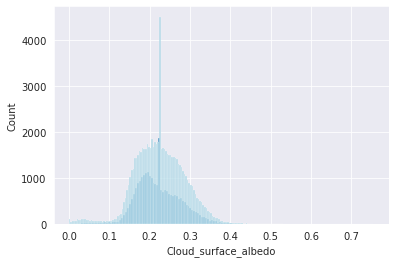

In [180]:
sns.histplot(data  = test['Cloud_surface_albedo']);
sns.histplot(data  = train['Cloud_surface_albedo'], color = 'lightblue');

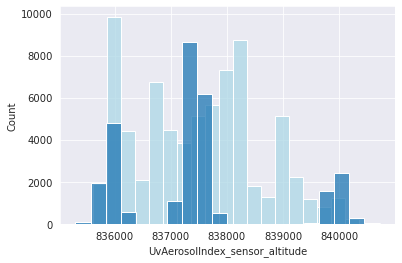

In [181]:
sns.histplot(data  = train['UvAerosolIndex_sensor_altitude'], color = 'lightblue',bins = 20);
sns.histplot(data  = test['UvAerosolIndex_sensor_altitude'], bins = 20);

In [182]:
(train['SulphurDioxide_cloud_fraction'].min()-train['SulphurDioxide_cloud_fraction'].max())/20

-0.01499933631589365

In [183]:
train_y  = train.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1)
for j in train_y.columns:
    print('Column: ', j)
    step = (train[j].max()-train[j].min())/20
    for i in np.arange(train[j].min(),train[j].max(), step):
        trainx = train[train[j] > i]
        trainx = trainx[trainx[j] <= i+ step]
    
        X = trainx.drop(['ID_LAT_LON_YEAR_WEEK','emission','outliers'], axis = 1).fillna(0)
        y = trainx.emission
    

# Splitting the data into training and testing sets
        try:
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = SEED)
        except:
            pass

        model = LGBMRegressor()
#     model = CatBoostRegressor()
        model.fit(X_train, y_train)

# X = test_outliers.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
# y_pred_outliers = model.predict(X)
#     # Local score
        y_pred = model.predict(X_test)
        score = mean_squared_error(y_test, y_pred, squared=False)
    
        print('Local RMSE:', score)
#     submission_outliers = pd.DataFrame({
#     "ID_LAT_LON_YEAR_WEEK" : test_outliers['ID_LAT_LON_YEAR_WEEK'],
#     'emission' : y_pred_outliers
# })
# submission_outliers.head()

Column:  latitude
Local RMSE: 919.8198768596073
Local RMSE: 652.5091516799107
Local RMSE: 34.51948142272443
Local RMSE: 60.22224760005494
Local RMSE: 127.2148376952382
Local RMSE: 127.2148376952382
Local RMSE: 127.2148376952382
Local RMSE: 1176.9687803921588
Local RMSE: 789.2168411820832
Local RMSE: 505.0286684193615
Local RMSE: 105.34962623989168
Local RMSE: 179.61101850400865
Local RMSE: 179.61101850400865
Local RMSE: 55.58579037031259
Local RMSE: 1254.3752580276478
Local RMSE: 8993.119303365382
Local RMSE: 504.00778929762134
Local RMSE: 504.00778929762134
Local RMSE: 51.43891738392674
Local RMSE: 148.31943449187924
Column:  longitude
Local RMSE: 121.77421435344769
Local RMSE: 121.77421435344769
Local RMSE: 121.77421435344769
Local RMSE: 121.77421435344769
Local RMSE: 121.77421435344769
Local RMSE: 121.77421435344769
Local RMSE: 8.0703469619722
Local RMSE: 74.89557085579725
Local RMSE: 1074.8842263285972
Local RMSE: 79.78938640343857
Local RMSE: 765.0306901251735
Local RMSE: 246.6466

KeyboardInterrupt: 

In [ ]:
maxi = train['Cloud_surface_albedo'].max()
mini = train['Cloud_surface_albedo'].min()
step = (maxi-mini)/30
for i in np.arange(mini,maxi, step):
    trainx = train[train['Cloud_surface_albedo'] > i]
    trainx = trainx[trainx['Cloud_surface_albedo'] <= i+ step]
    
    X = trainx.drop(['ID_LAT_LON_YEAR_WEEK','emission','outliers'], axis = 1).fillna(0)
    y = trainx.emission
    
#     testx = test[test['Cloud_surface_albedo'] > i]
#     testx = testx[testx['Cloud_surface_albedo'] <= i+ step]
    

# Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = SEED)

    model = LGBMRegressor()
#     model = CatBoostRegressor()
    model.fit(X_train, y_train)

#     X = testx.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
#     y_pred = model.predict(X)
#     # Local score
    y_pred = model.predict(X_test)
    score = mean_squared_error(y_test, y_pred, squared=False)
    
    print('Local RMSE:', score)
#     submission_outliers = pd.DataFrame({
#     "ID_LAT_LON_YEAR_WEEK" : test_outliers['ID_LAT_LON_YEAR_WEEK'],
#     'emission' : y_pred_outliers
# })
# submission_outliers.head()

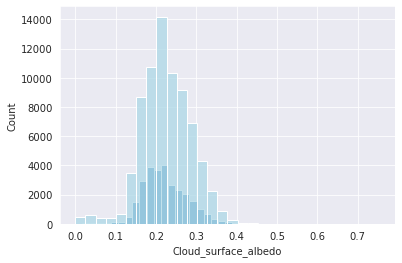

In [184]:
sns.histplot(data  = test['Cloud_surface_albedo'], bins = 30);
sns.histplot(data  = train['Cloud_surface_albedo'], color = 'lightblue', bins = 30);

In [185]:
train.ID_LAT_LON_YEAR_WEEK[train['Cloud_surface_albedo'] == 0.2]

Series([], Name: ID_LAT_LON_YEAR_WEEK, dtype: object)

In [209]:
maxi = 0.3
mini = 0.15
step = (maxi-mini)/30

place_id = []
prediction = []
for i in np.arange(mini,maxi, step):
    trainx = train[train['Cloud_surface_albedo'] > i]
    trainx = trainx[trainx['Cloud_surface_albedo'] <= i+ step]
    testx = test[test['Cloud_surface_albedo'] > i]
    testx = testx[testx['Cloud_surface_albedo'] <= i+ step]
    
    X = trainx.drop(['ID_LAT_LON_YEAR_WEEK','emission','outliers'], axis = 1).fillna(0)
    y = trainx.emission

# Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)
#     model = CatBoostRegressor()
    model = LGBMRegressor()
    model.fit(X_train, y_train)

    # Local score
    X = testx.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
    pred_y = model.predict(X)
    
    test_id = testx['ID_LAT_LON_YEAR_WEEK'].values
    place_id.append(test_id)
    prediction.append(pred_y)
    
pred = []
placeId = []
for i in place_id:
    for j in i:
        placeId.append(j)
for i in prediction:
    for j in i:
        pred.append(j)
submission_z = pd.DataFrame({
    'ID_LAT_LON_YEAR_WEEK': placeId,
    'emission': pred
    
})
submission_z['ID_LAT_LON_YEAR_WEEK'].value_counts()

ID_-23.53_27.47_2020_20    1
ID_-28.03_29.67_2019_21    1
ID_-28.03_29.77_2021_17    1
ID_-28.03_29.77_2020_44    1
ID_-28.03_29.77_2020_18    1
ID_-28.03_29.77_2019_41    1
ID_-28.03_29.77_2019_18    1
ID_-28.03_29.67_2021_28    1
ID_-28.03_29.67_2021_17    1
ID_-28.03_29.67_2020_30    1
ID_-28.03_29.67_2019_29    1
ID_-27.93_30.37_2022_15    1
ID_-27.93_30.27_2019_20    1
ID_-27.93_30.37_2022_10    1
ID_-27.93_30.37_2021_44    1
ID_-27.93_30.37_2021_15    1
ID_-27.93_30.27_2022_15    1
ID_-27.93_30.27_2022_12    1
ID_-27.93_30.27_2022_9     1
ID_-27.93_30.27_2021_52    1
ID_-27.93_30.27_2021_17    1
ID_-27.93_30.27_2020_45    1
ID_-28.03_29.77_2021_48    1
ID_-28.03_29.77_2021_49    1
ID_-28.03_29.87_2021_10    1
ID_-28.03_29.87_2022_48    1
ID_-28.03_30.37_2019_48    1
ID_-28.03_30.37_2019_43    1
ID_-28.03_30.37_2019_2     1
ID_-28.03_30.27_2022_13    1
ID_-28.03_30.27_2022_11    1
ID_-28.03_30.27_2022_6     1
ID_-28.03_30.27_2021_44    1
ID_-28.03_30.27_2021_11    1
ID_-28.03_30.2

In [210]:
test.shape[0] == test_x.shape[0]+ test_y.shape[0] + len(pred)

True

In [211]:
test['ID_LAT_LON_YEAR_WEEK'].values

array(['ID_-23.53_27.47_2019_1', 'ID_-23.53_27.47_2019_2',
       'ID_-23.53_27.47_2019_3', ..., 'ID_-34.03_18.87_2022_47',
       'ID_-34.03_18.87_2022_48', 'ID_-34.03_18.87_2022_52'], dtype=object)

In [212]:
train_x = train[train['Cloud_surface_albedo'] < 0.15]
test_x = test[test['Cloud_surface_albedo'] < 0.15]
train_y = train[train['Cloud_surface_albedo'] > 0.3]
test_y = test[test['Cloud_surface_albedo'] > 0.3]

X = train_x.drop(['ID_LAT_LON_YEAR_WEEK','emission', 'outliers'], axis = 1).fillna(0)
y = train_x.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

model = LGBMRegressor()
# model = CatBoostRegressor()
model.fit(X_train, y_train)

    # Local score
X = test_x.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
pred_x= model.predict(X)


X = train_y.drop(['ID_LAT_LON_YEAR_WEEK','emission', 'outliers'], axis = 1).fillna(0)
y = train_y.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.001, random_state = SEED)

model = LGBMRegressor()
# model = CatBoostRegressor()
model.fit(X_train, y_train)

    # Local score
X = test_y.drop(['ID_LAT_LON_YEAR_WEEK'], axis = 1).fillna(0)
pred_y= model.predict(X)

submission_x = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test_x['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred_x
})
submission_y = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test_y['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred_y
})

frames = [submission_x, submission_y, submission_z]
submission = pd.concat(frames)
pred = []

predictions_in_order = []
for i in test['ID_LAT_LON_YEAR_WEEK']:
    prediction_for_id = submission.emission[submission["ID_LAT_LON_YEAR_WEEK"] == i]
    predictions_in_order.append(prediction_for_id)

for i in predictions_in_order:
    for j in i.values:
        pred.append(j)
        
submission_13 = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test['ID_LAT_LON_YEAR_WEEK'],
    'emission' : pred
})
submission_13.to_csv('submission_13.csv', index = False)

In [97]:
submission.

,ID_LAT_LON_YEAR_WEEK,emission
10014,69027.02000,40571.36937
1569,69027.02000,152.52873
7397,69027.02000,17177.48387
5357,69027.02000,-1472.38316
5270,ID_-23.93_27.57_2021_42,24565.87338


In [89]:
predictions_in_order

[Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([], Name: emission, dtype: float64),
 Series([]

In [214]:
train['Cloud_surface_albedo'].describe()

count   74005.00000
mean        0.22544
std         0.06196
min         0.00000
25%         0.18506
50%         0.22544
75%         0.26590
max         0.75433
Name: Cloud_surface_albedo, dtype: float64

In [206]:
['latitude','longitude','UvAerosolIndex_sensor_altitude','Cloud_surface_albedo']'year','SulphurDioxide_SO2_column_number_density','CarbonMonoxide_H2O_column_number_density'
'NitrogenDioxide_sensor_altitude'

SyntaxError: invalid syntax (4290999821.py, line 1)

In [175]:
train.columns

Index(['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no',
       'SulphurDioxide_SO2_column_number_density',
       'SulphurDioxide_SO2_column_number_density_amf',
       'SulphurDioxide_SO2_slant_column_number_density',
       'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle',
       'SulphurDioxide_sensor_zenith_angle',
       'SulphurDioxide_solar_azimuth_angle',
       'SulphurDioxide_solar_zenith_angle',
       'SulphurDioxide_SO2_column_number_density_15km',
       'CarbonMonoxide_CO_column_number_density',
       'CarbonMonoxide_H2O_column_number_density',
       'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude',
       'CarbonMonoxide_sensor_azimuth_angle',
       'CarbonMonoxide_sensor_zenith_angle',
       'CarbonMonoxide_solar_azimuth_angle',
       'CarbonMonoxide_solar_zenith_angle',
       'NitrogenDioxide_NO2_column_number_density',
       'NitrogenDioxide_tropospheric_NO2_column_number_density',
       'NitrogenDioxide

<a name="Engineering"></a>
## 10. Feature engineering









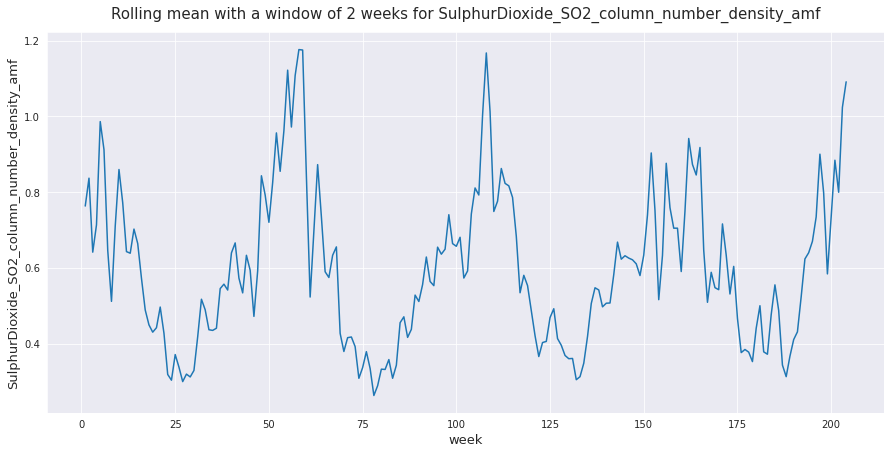

In [102]:
# Examples of feature engineering - Aggregations, cumulative differences, moving averages ...
# Lets explore the rolling mean
# First we create a unique location from lat lon
train['location'] = [str(x) + '_' + str(y) for x, y in zip(train.latitude, train.longitude)]

# Filter based on one location
example_loc = train[train.location == '-23.73_28.77']

# Calculate rolling mean for SulphurDioxide_SO2_column_number_density_amf with a window of 2 weeks
rolling_mean = example_loc['SulphurDioxide_SO2_column_number_density_amf'].rolling(window = 2).mean()

# Visualise rolling mean
plt.figure(figsize = (15, 7))
rolling_mean.plot()
plt.title('Rolling mean with a window of 2 weeks for SulphurDioxide_SO2_column_number_density_amf', y = 1.02, fontsize = 15)
plt.xlabel('week', y = 1.05, fontsize = 13)
plt.ylabel('SulphurDioxide_SO2_column_number_density_amf', x = 1.05, fontsize = 13)
plt.show()

 - There is a cyclic pattern from the above graph, which clearly shows that there is a pattern - This will be helpful to our model
 - With more research and domain knowledge generate useful features that can improve your model performance

 Other examples of feature engineering:
  - Creating cluster regions
  - Interactions between different pollutatnts - ratios, additions,subtractions...
  - Time series features

In [103]:
# Generate the above feature - rolling mean for all locations for both the train and test

# Feature engineering train
train_roll_mean = train.sort_values(by = ['location', 'year', 'week_no']).groupby(['location'])[train.columns[5:].tolist()].rolling(window = 2).mean().reset_index()
train_roll_mean.drop(['level_1', 'emission', 'location'], axis = 1, inplace = True)
train_roll_mean.columns = [col + '_roll_mean' for col in train_roll_mean.columns]

# Feature engineering test
test.latitude, test.longitude = round(test.latitude, 2), round(test.longitude, 2)
test['location'] = [str(x) + '_' + str(y) for x, y in zip(test.latitude, test.longitude)]
test_roll_mean = test.sort_values(by = ['location', 'year', 'week_no']).groupby(['location'])[test.columns[5:].tolist()].rolling(window = 2).mean().reset_index()
test_roll_mean.drop(['level_1', 'location'], axis = 1, inplace = True)
test_roll_mean.columns =  [col + '_roll_mean' for col in test_roll_mean.columns]
test_roll_mean.head()

,SulphurDioxide_SO2_column_number_density_roll_mean,SulphurDioxide_SO2_column_number_density_amf_roll_mean,SulphurDioxide_SO2_slant_column_number_density_roll_mean,SulphurDioxide_cloud_fraction_roll_mean,SulphurDioxide_sensor_azimuth_angle_roll_mean,SulphurDioxide_sensor_zenith_angle_roll_mean,SulphurDioxide_solar_azimuth_angle_roll_mean,SulphurDioxide_solar_zenith_angle_roll_mean,SulphurDioxide_SO2_column_number_density_15km_roll_mean,CarbonMonoxide_CO_column_number_density_roll_mean,...,Cloud_cloud_top_pressure_roll_mean,Cloud_cloud_top_height_roll_mean,Cloud_cloud_base_pressure_roll_mean,Cloud_cloud_base_height_roll_mean,Cloud_cloud_optical_depth_roll_mean,Cloud_surface_albedo_roll_mean,Cloud_sensor_azimuth_angle_roll_mean,Cloud_sensor_zenith_angle_roll_mean,Cloud_solar_azimuth_angle_roll_mean,Cloud_solar_zenith_angle_roll_mean
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.00013,0.43882,0.00005,0.09470,-49.02600,55.93510,-92.36411,26.77170,0.00002,0.02549,...,79559.85276,1581.44280,85797.36225,1244.57112,7.99207,0.25980,17.63036,45.73788,-89.10936,18.38737
2,0.00012,0.56813,0.00005,0.09466,-0.52002,44.99212,-88.07020,21.95860,0.00002,0.02503,...,81572.57215,1282.79200,87845.40093,966.94467,6.03470,0.24881,71.20704,49.73737,-84.13451,14.84474
3,0.00027,0.57377,0.00011,0.12280,-2.87484,47.10618,-82.84357,22.25336,0.00004,0.02369,...,70029.20519,2759.19246,76436.59161,2217.60082,6.52650,0.27011,32.44998,51.01341,-80.51563,19.53348
4,0.00034,0.60875,0.00016,0.14627,-8.86249,49.32330,-77.79334,22.96216,0.00007,0.02297,...,69815.08349,2791.47925,75984.38720,2275.47881,9.02194,0.28155,-12.15887,55.84850,-77.19218,22.99610


In [104]:
# Merge engineered features with train and test set

#Train
train_eng = train.sort_values(by = ['location', 'year', 'week_no'], ignore_index = True).merge(train_roll_mean, how = 'left',
                                                                                               left_index=True, right_index=True)

# Test
test_eng = test.sort_values(by = ['location', 'year', 'week_no'], ignore_index = True).merge(test_roll_mean, how = 'left',
                                                                                               left_index=True, right_index=True)

# Preview engineered test set
test_eng.head()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_pressure_roll_mean,Cloud_cloud_top_height_roll_mean,Cloud_cloud_base_pressure_roll_mean,Cloud_cloud_base_height_roll_mean,Cloud_cloud_optical_depth_roll_mean,Cloud_surface_albedo_roll_mean,Cloud_sensor_azimuth_angle_roll_mean,Cloud_sensor_zenith_angle_roll_mean,Cloud_solar_azimuth_angle_roll_mean,Cloud_solar_zenith_angle_roll_mean
0,ID_-23.53_27.47_2019_1,-23.53000,27.47000,2019,1,0.00008,0.45447,0.00003,0.11429,-80.28631,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ID_-23.53_27.47_2019_2,-23.53000,27.47000,2019,2,0.00018,0.42317,0.00006,0.07510,-17.76569,...,79559.85276,1581.44280,85797.36225,1244.57112,7.99207,0.25980,17.63036,45.73788,-89.10936,18.38737
2,ID_-23.53_27.47_2019_3,-23.53000,27.47000,2019,3,0.00006,0.71309,0.00004,0.11421,16.72565,...,81572.57215,1282.79200,87845.40093,966.94467,6.03470,0.24881,71.20704,49.73737,-84.13451,14.84474
3,ID_-23.53_27.47_2019_4,-23.53000,27.47000,2019,4,0.00048,0.43445,0.00017,0.13139,-22.47534,...,70029.20519,2759.19246,76436.59161,2217.60082,6.52650,0.27011,32.44998,51.01341,-80.51563,19.53348
4,ID_-23.53_27.47_2019_5,-23.53000,27.47000,2019,5,0.00019,0.78304,0.00014,0.16114,4.75036,...,69815.08349,2791.47925,75984.38720,2275.47881,9.02194,0.28155,-12.15887,55.84850,-77.19218,22.99610


<a name="Modelling"></a>
## 11.  Modelling

In [57]:
# Selecting the independent variables and the target variable

X = train_eng.drop(['ID_LAT_LON_YEAR_WEEK', 'location', 'emission'], axis = 1).fillna(0)
y = train_eng.emission

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = SEED)

model = LGBMRegressor()
model.fit(X_train, y_train)

    # Local score
y_pred = model.predict(X_test)
score = mean_squared_error(y_test, y_pred, squared=False)
    
print('Local RMSE:', score)
# # Instantiating the model
# clf = RandomForestRegressor(random_state = SEED, n_jobs=-1)
# clf.fit(X_train, y_train)

# # Making predictions
# y_pred = clf.predict(X_test)

# # Measuring the accuracy of the model
# print(f'RMSE Score: {mean_squared_error(y_test, y_pred, squared=False)}') # 23432.342352754695

Local RMSE: 6436.583943980925


In [60]:
X = test_eng.drop(['ID_LAT_LON_YEAR_WEEK', 'location'], axis = 1).fillna(0)
predictions = model.predict(X)
submission_2 = pd.DataFrame({
    "ID_LAT_LON_YEAR_WEEK" : test['ID_LAT_LON_YEAR_WEEK'],
    'emission': predictions
})
submission_2.to_csv('submission_2.csv', index = False)

In [ ]:
X_test.head()

In [28]:
# Analyse predictions
pred_errors = X_test.copy()
pred_errors['emission'] = y_test
pred_errors['prediction'] = y_pred
pred_errors['error'] = abs(pred_errors.prediction - pred_errors.emission)
pred_errors = pred_errors[['latitude',	'longitude',	'year',	'week_no', 'emission', 'prediction', 'error']]
pred_errors.sort_values(by = 'error', ascending = False, inplace = True)
pred_errors.head()

,latitude,longitude,year,week_no,emission,prediction,error
20432,-25.93000,29.37000,2021,34,992748.75000,36295.51296,956453.23704
20344,-25.93000,29.37000,2019,50,979504.20000,103261.03637,876243.16363
20362,-25.93000,29.37000,2020,16,867647.70000,12913.74035,854733.95965
20397,-25.93000,29.37000,2020,51,934806.80000,94880.18263,839926.61737
20458,-25.93000,29.37000,2022,8,835917.30000,11699.94290,824217.35710


In [29]:
pred_errors.tail()

,latitude,longitude,year,week_no,emission,prediction,error
35350,-28.03000,21.37000,2020,39,2.66638,2.66618,0.00019
43703,-28.63000,21.27000,2019,39,1.04626,1.04645,0.00019
30632,-27.03000,24.67000,2020,36,2.13081,2.13094,0.00013
35311,-28.03000,21.37000,2019,52,0.94331,0.94340,0.00009
39257,-28.23000,21.47000,2020,51,1.02328,1.02323,0.00005


In [30]:
train.emission.describe()

count     74005.00000
mean       7891.06097
std       52571.60466
min           0.04806
25%         154.54720
50%         723.13586
75%        2773.02930
max     1181701.20000
Name: emission, dtype: float64

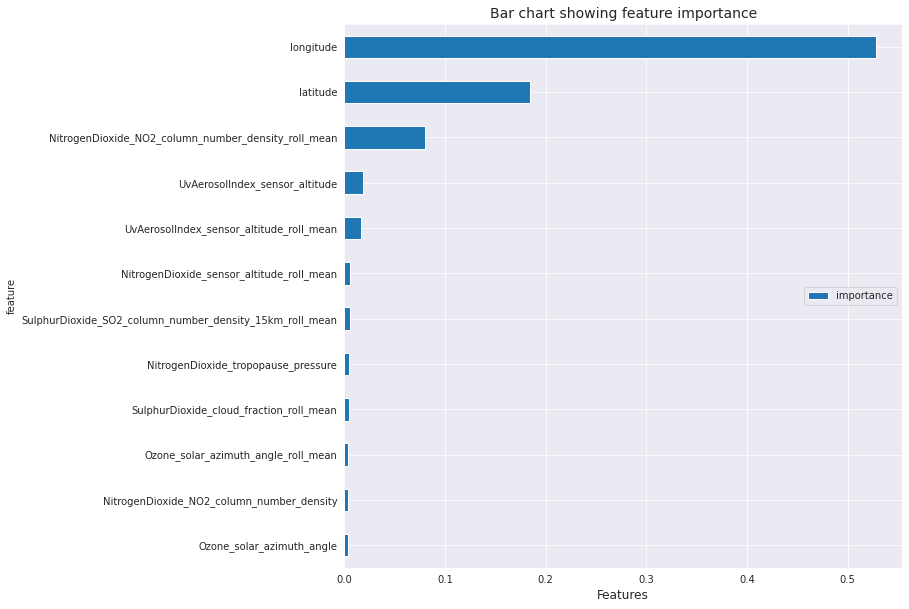

In [31]:
# Feature importance
impo_df = pd.DataFrame({'feature': X.columns, 'importance': clf.feature_importances_}).set_index('feature').sort_values(by = 'importance', ascending = False)
impo_df = impo_df[:12].sort_values(by = 'importance', ascending = True)
impo_df.plot(kind = 'barh', figsize = (10, 10))
plt.legend(loc = 'center right')
plt.title('Bar chart showing feature importance', fontsize = 14)
plt.xlabel('Features', fontsize = 12)
plt.show()

<a name="Predictions"></a>
## 12. Making predictions of the test set and creating a submission file

In [32]:
# Make prediction on the test set
test_df = test_eng.drop(['ID_LAT_LON_YEAR_WEEK', 'location'], axis = 1).fillna(0)
predictions = clf.predict(test_df)

# # Create a submission file
sub_file = pd.DataFrame({'ID_LAT_LON_YEAR_WEEK': test_eng.ID_LAT_LON_YEAR_WEEK, 'emission': predictions})
sub_file.head()

,ID_LAT_LON_YEAR_WEEK,emission
0,ID_-23.53_27.47_2019_1,2712.14031
1,ID_-23.53_27.47_2019_2,2613.35232
2,ID_-23.53_27.47_2019_3,2596.63830
3,ID_-23.53_27.47_2019_4,2801.26996
4,ID_-23.53_27.47_2019_5,5014.14238


In [33]:
# Create file
sub_file.to_csv('BaselineSubmission.csv', index = False) # Download subfile and submit to zindi for scoring

## ALL THE BEST AND HAVE FUN &#x1F60E;